In [1]:
import os
import pandas as pd
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import seaborn as sns
import glob

# import sesame as ssm

In [2]:
raw_path = os.path.join(os.path.dirname(os.getcwd()), 'data', 'raw/')
output_path = os.path.join(os.path.dirname(os.getcwd()),'data', 'output/')
plot_path = os.path.join(os.path.dirname(os.getcwd()), 'data', 'plot/')
netcdf_path = os.path.join(os.path.dirname(os.getcwd()), 'data', 'netcdf/')
atlas_path = os.path.join(os.path.dirname(os.getcwd()), 'data', 'atlas/')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14940.56
Edges after gravity calculation: 7965052
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7965052
IPF complete. Flow matrix generated with 7965052 edges.


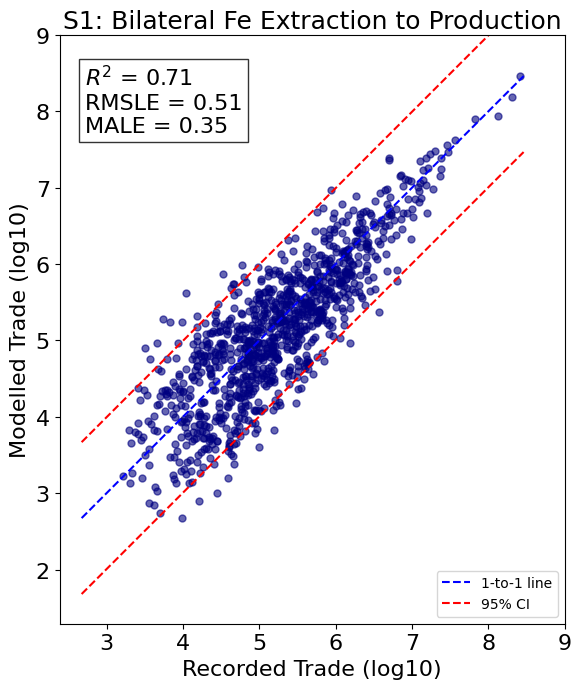

In [66]:
%load_ext autoreload
%autoreload 2

from FlowNetwork import FlowNetwork
import os
import pandas as pd

verbose = True

# Initialize the flow network with NetCDF data and variable names
grid_data_path = netcdf_path + 'L.T.iron_flows.2008-2016_adj.a.nc'
json_path = output_path + 'grouped_region.json'
bilateral_csv_path = output_path + 'iron_io_stage_1_adj.csv'
trade_tariff_path = raw_path + 'tariffsPairs_88_21_vbeta1-2024-12.csv'

fn = FlowNetwork(grid_data_path, 'source_1_adj', 'sink_1_adj', time='2016')
fn.gravity_model(distance='tariff', threshold_percentile=100, trade_tariff_path=trade_tariff_path, year=2016, tariff_weight_factor=2, verbose=True)
fn.ipf_flows(max_iters=100, tol=1e-6, verbose=verbose)
fn.bilateral_flow(2016, json_path)
df, metrics = fn.validate_bilateral(bilateral_csv_path, year=2016, column='tonnes_adj_1', x_log=True, y_log=True, title="S1: Bilateral Fe Extraction to Production", x_label="Recorded Trade (log10)", y_label="Modelled Trade (log10)", fontsize=16, xmax=9, ymax=9)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


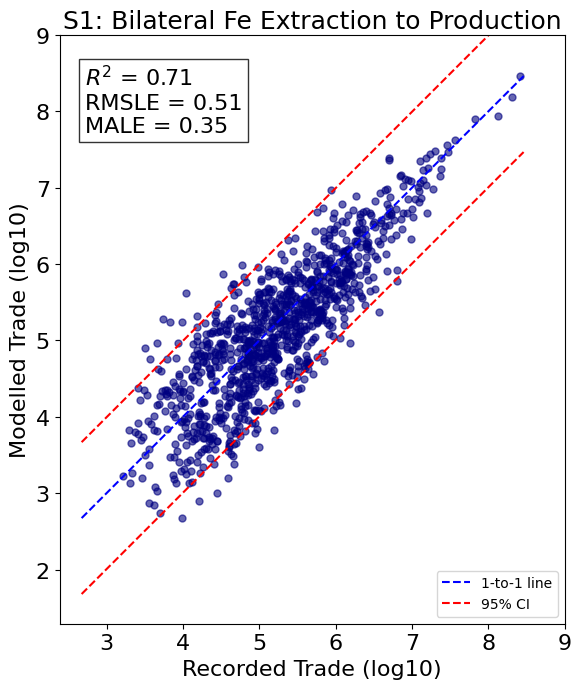

In [51]:
%load_ext autoreload
%autoreload 2

from FlowNetwork import FlowNetwork
import os
import pandas as pd

verbose = True

# Initialize the flow network with NetCDF data and variable names
grid_data_path = netcdf_path + 'L.T.iron_flows.2008-2016_adj.a.nc'
json_path = output_path + 'grouped_region.json'
bilateral_csv_path = output_path + 'iron_io_stage_1_adj.csv'
trade_tariff_path = raw_path + 'tariffsPairs_88_21_vbeta1-2024-12.csv'

# fn = FlowNetwork(grid_data_path, 'source_1_adj', 'sink_1_adj', time='2016')
# fn.gravity_model(distance='tariff', threshold_percentile=100, trade_tariff_path=trade_tariff_path, year=2016, tariff_weight_factor=2, verbose=True)
# fn.ipf_flows(max_iters=100, tol=1e-6, verbose=verbose)
# fn.bilateral_flow(2016, json_path)
df, metrics = fn.validate_bilateral(bilateral_csv_path, year=2016, column='tonnes_adj_1', x_log=True, y_log=True, title="S1: Bilateral Fe Extraction to Production", x_label="Recorded Trade (log10)", y_label="Modelled Trade (log10)", fontsize=16, xmax=9, ymax=9)
# # df.to_csv("model_output_s1.csv", index=False)
# fn.regional_trade_comparison(x_log=True, y_log=True, title="Recorded vs Modelled Trade", x_label="Recorded Trade (log10)", y_label="Modelled Trade (log 10)", fontsize=16, xmax=9, ymax=9, rm_outliers=False, output_dir=plot_path, filename=f"regional_trade_s1_2016.pdf")
# # fn.save_to_netcdf(output_dir=netcdf_path, filename="gravity_model_output_s1.nc")
# # fn.mass_displacement(output_dir=netcdf_path, filename="gravity_mass_displacement_s1.nc")
# fn.plot_network_map(title="Fe Extraction to Production", radius=3, color="darkblue", bins=[0.1, 15, 30, 60, 100, np.inf], labels=['0–15', '15–30', '30–60', '60–100', '>100'], num_edges=1500, edge_alpha=0.6, edge_cmap="magma", steps=20, 
#                     output_dir=plot_path, filename=f"network_map_s1_2016.pdf"
#                     )

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


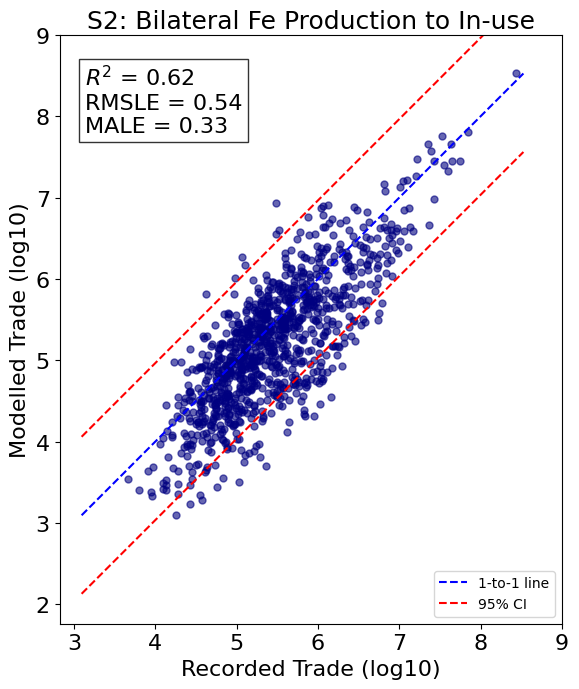

In [47]:
%load_ext autoreload
%autoreload 2

from FlowNetwork import FlowNetwork
import os
import pandas as pd

verbose = True

# Initialize the flow network with NetCDF data and variable names
grid_data_path = netcdf_path + 'L.T.iron_flows.2008-2016_adj.a.nc'
json_path = output_path + 'grouped_region.json'
bilateral_csv_path = output_path + 'iron_io_stage_2_adj.csv'
trade_tariff_path = raw_path + 'tariffsPairs_88_21_vbeta1-2024-12.csv'

year = 2016
# fn_2 = FlowNetwork(grid_data_path, 'source_2_adj', 'sink_2_adj', time=year)
# fn_2.gravity_model(distance='tariff', threshold_percentile=100, trade_tariff_path=trade_tariff_path, year=year, tariff_weight_factor=2, verbose=True)
# fn_2.ipf_flows(max_iters=100, tol=1e-6, verbose=verbose)
# fn_2.bilateral_flow(year, json_path)
df, metrics_bilateral = fn_2.validate_bilateral(bilateral_csv_path, year=year, column='tonnes_adj_2', x_log=True, y_log=True, rm_outliers=False, title="S2: Bilateral Fe Production to In-use", x_label="Recorded Trade (log10)", y_label="Modelled Trade (log10)", fontsize=16, xmax=9, ymax=9)
# metrics_regional = fn_2.regional_trade_comparison(x_log=True, y_log=True, title="Recorded vs Modelled Trade", x_label="Recorded Trade (log10)", y_label="Modelled Trade (log10)", fontsize=16, xmax=9, ymax=9, rm_outliers=False, output_dir=plot_path, filename=f"regional_trade_s2_{year}.pdf")
# # fn_2.save_to_netcdf(output_dir=netcdf_path, filename=f"gravity_model_output_s2_{year}.nc")
# # fn_2.mass_displacement(output_dir=netcdf_path, filename=f"gravity_mass_displacement_s2_{year}.nc")
# fn_2.plot_network_map(title="Fe Production to End-use", radius=3, color="darkblue", bins=[0, 15, 30, 60, 100, np.inf], labels=['0–15', '15–30', '30–60', '60–100', '>100'], num_edges=3000, edge_alpha=0.6, edge_cmap="magma", steps=20, output_dir=plot_path, filename=f"network_map_s2_{year}.pdf")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14940.56
Edges after gravity calculation: 7965052
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7965052
IPF complete. Flow matrix generated with 7965052 edges.
Top 1,500 edges cover 26.08% of total flow.


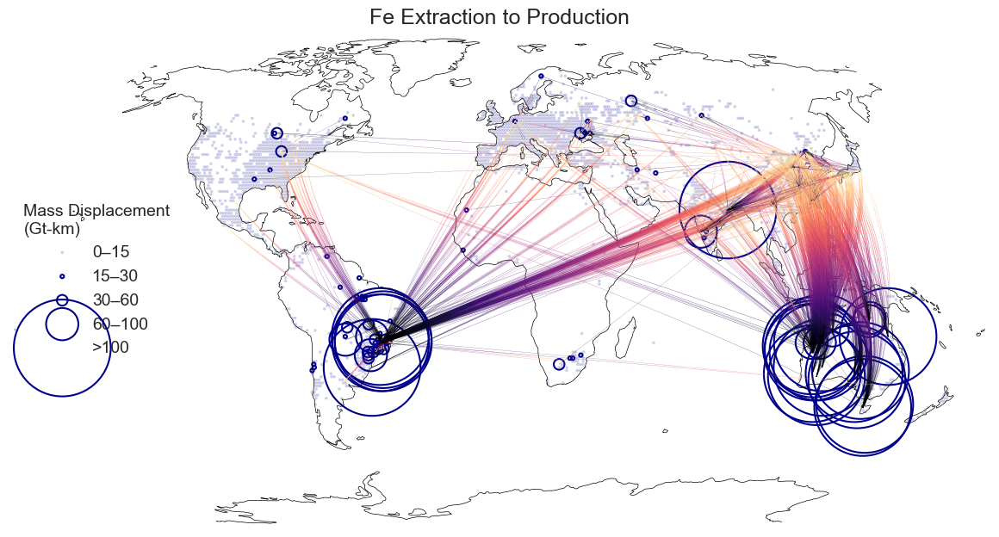

In [94]:
%load_ext autoreload
%autoreload 2

from FlowNetwork import FlowNetwork
import os
import pandas as pd

verbose = True

# Initialize the flow network with NetCDF data and variable names
grid_data_path = netcdf_path + 'L.T.iron_flows.2008-2016_adj.a.nc'
json_path = output_path + 'grouped_region.json'
bilateral_csv_path = output_path + 'iron_io_stage_1_adj.csv'
trade_tariff_path = raw_path + 'tariffsPairs_88_21_vbeta1-2024-12.csv'

fn = FlowNetwork(grid_data_path, 'source_1_adj', 'sink_1_adj', time='2016')
fn.gravity_model(distance='tariff', threshold_percentile=100, trade_tariff_path=trade_tariff_path, year=2016, tariff_weight_factor=2, verbose=True)
fn.ipf_flows(max_iters=100, tol=1e-6, verbose=verbose)
# fn.bilateral_flow(2016, json_path)
# df, metrics = fn.validate_bilateral(bilateral_csv_path, year=2016, column='tonnes_adj_1', x_log=True, y_log=True, rm_outliers=False)
# df.to_csv("model_output_s1.csv", index=False)
# fn.regional_trade_comparison(x_log=False, y_log=False, title="Recorded vs Modelled Trade", x_label="Recorded Trade", y_label="Modelled Trade", fontsize=12, xmax=9, ymax=9, rm_outliers=False, output_dir=None, filename=None)
# fn.save_to_netcdf(output_dir=netcdf_path, filename="gravity_model_output_s1.nc")
# fn.mass_displacement(output_dir=netcdf_path, filename="gravity_mass_displacement_s1.nc")
fn.plot_network_map(title="Fe Extraction to Production", radius=3, color="darkblue", bins=[0.1, 15, 30, 60, 100, np.inf], labels=['0–15', '15–30', '30–60', '60–100', '>100'], num_edges=1500, edge_alpha=0.6, edge_cmap="magma", steps=20, output_dir=plot_path, filename=f"network_map_s1_2016.pdf")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 15161.50
Edges after gravity calculation: 7956533
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7956533
IPF complete. Flow matrix generated with 7956533 edges.
Top 3,000 edges cover 17.27% of total flow.


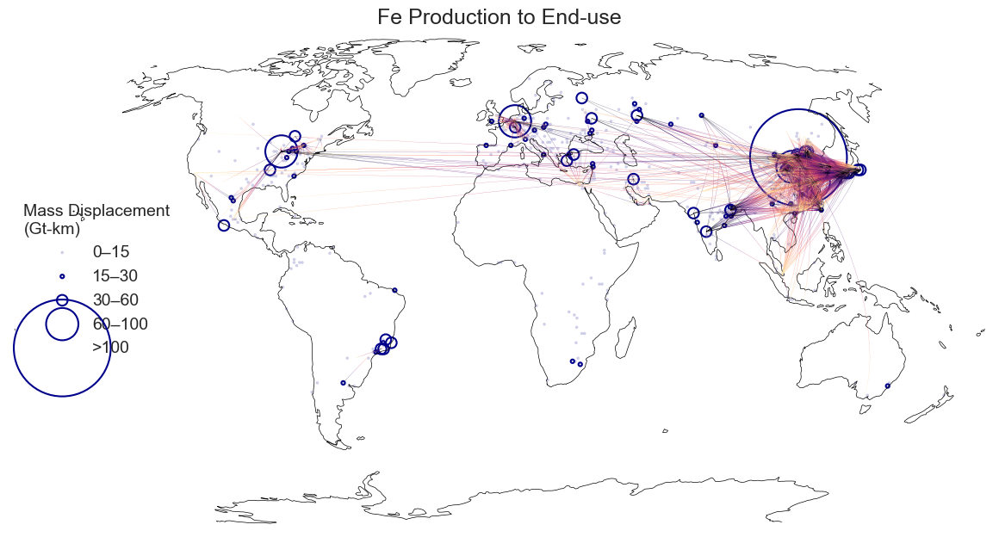

In [93]:
%load_ext autoreload
%autoreload 2

from FlowNetwork import FlowNetwork
import os
import pandas as pd

verbose = True

# Initialize the flow network with NetCDF data and variable names
grid_data_path = netcdf_path + 'L.T.iron_flows.2008-2016_adj.a.nc'
json_path = output_path + 'grouped_region.json'
bilateral_csv_path = output_path + 'iron_io_stage_2_adj.csv'
trade_tariff_path = raw_path + 'tariffsPairs_88_21_vbeta1-2024-12.csv'

year = 2016
fn = FlowNetwork(grid_data_path, 'source_2_adj', 'sink_2_adj', time=year)
fn.gravity_model(distance='tariff', threshold_percentile=100, trade_tariff_path=trade_tariff_path, year=year, tariff_weight_factor=2, verbose=True)
fn.ipf_flows(max_iters=100, tol=1e-6, verbose=verbose)
# fn.bilateral_flow(year, json_path)
# df, metrics_bilateral = fn.validate_bilateral(bilateral_csv_path, year=year, column='tonnes_adj_2', x_log=True, y_log=True, rm_outliers=False)
# metrics_regional = fn.regional_trade_comparison(x_log=True, y_log=True, title="Recorded vs Modelled Trade", x_label="Recorded Trade", y_label="Modelled Trade", fontsize=12, xmax=9, ymax=9, rm_outliers=False, output_dir=output_path, filename=f"regional_trade_s2_{year}.pdf")
# fn.save_to_netcdf(output_dir=netcdf_path, filename=f"gravity_model_output_s2_{year}.nc")
# fn.mass_displacement(output_dir=netcdf_path, filename=f"gravity_mass_displacement_s2_{year}.nc")
fn.plot_network_map(title="Fe Production to End-use", radius=3, color="darkblue", bins=[0, 15, 30, 60, 100, np.inf], labels=['0–15', '15–30', '30–60', '60–100', '>100'], num_edges=3000, edge_alpha=0.6, edge_cmap="magma", steps=20, output_dir=plot_path, filename=f"network_map_s2_{year}.pdf")

# Stage 1

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 16352.73
Edges after gravity calculation: 7313731
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7313731
IPF complete. Flow matrix generated with 7313731 edges.


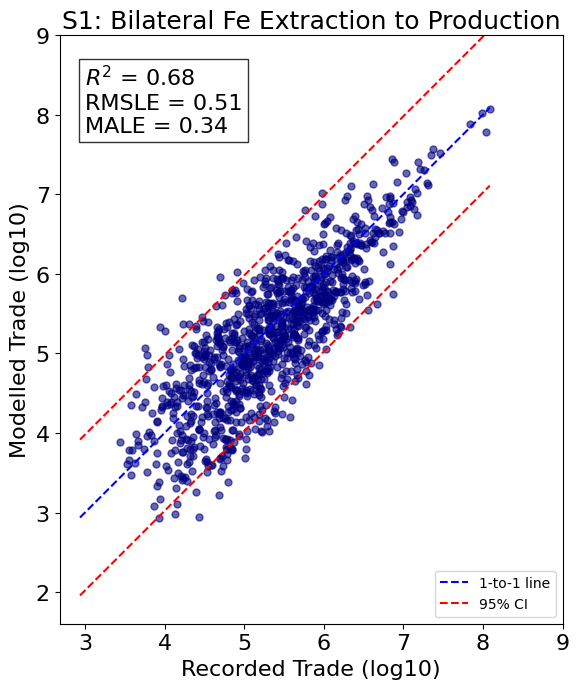

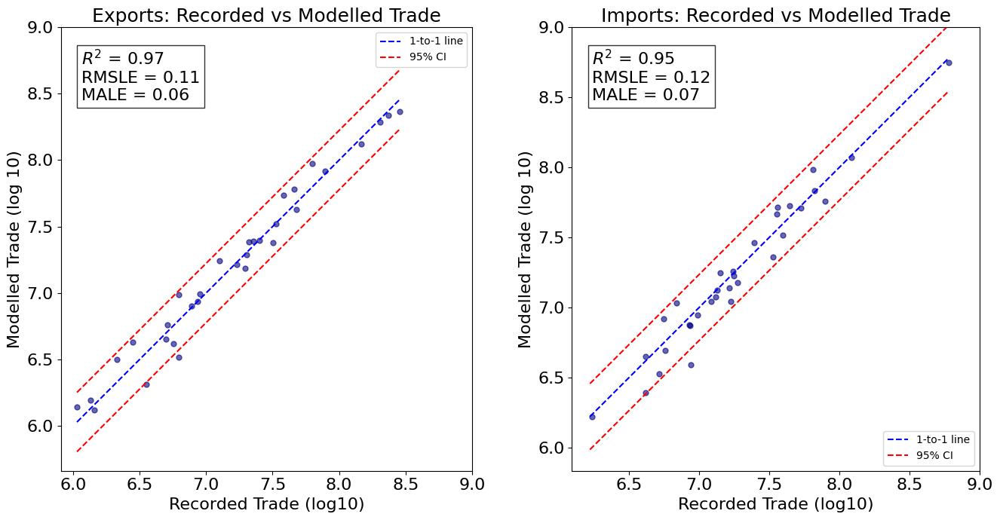

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s1_2008.nc
Top 1,500 edges cover 22.49% of total flow.
Map saved at: /Users/faisal/Documents/iESD/FeFlow/data/plot/network_map_s1_2008.png


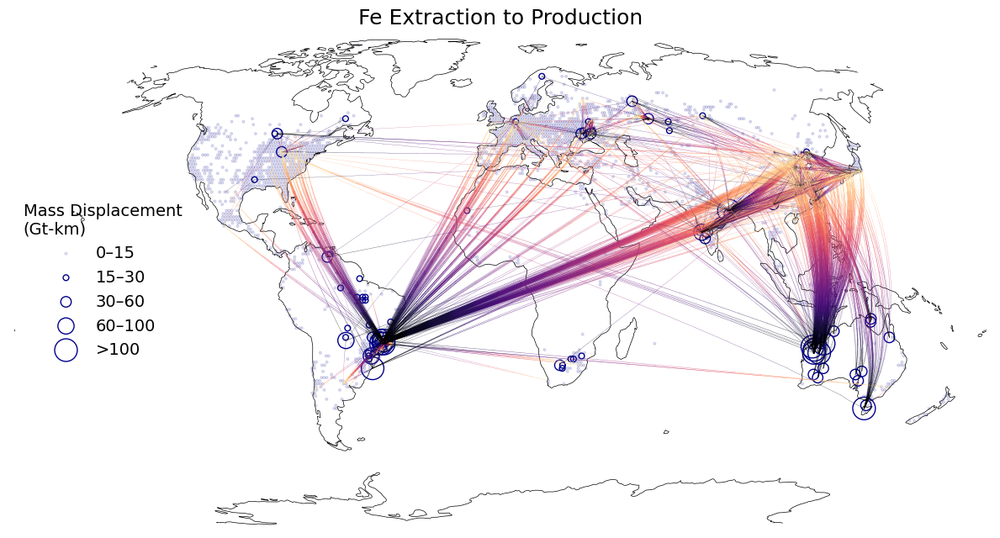

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14883.07
Edges after gravity calculation: 7411808
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7411808
IPF complete. Flow matrix generated with 7411808 edges.


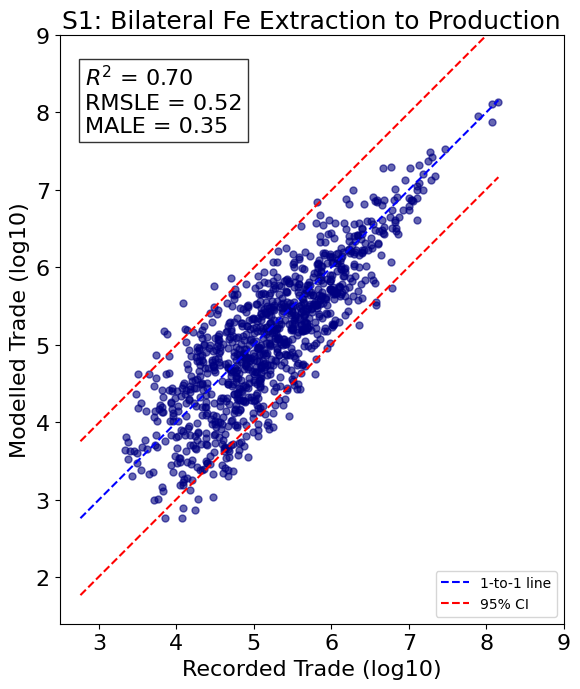

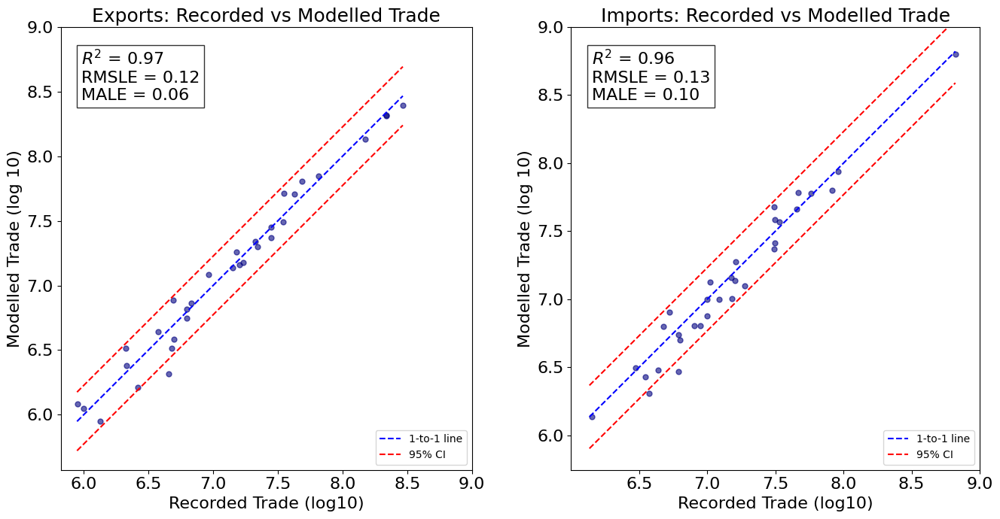

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s1_2009.nc
Top 1,500 edges cover 24.61% of total flow.
Map saved at: /Users/faisal/Documents/iESD/FeFlow/data/plot/network_map_s1_2009.png


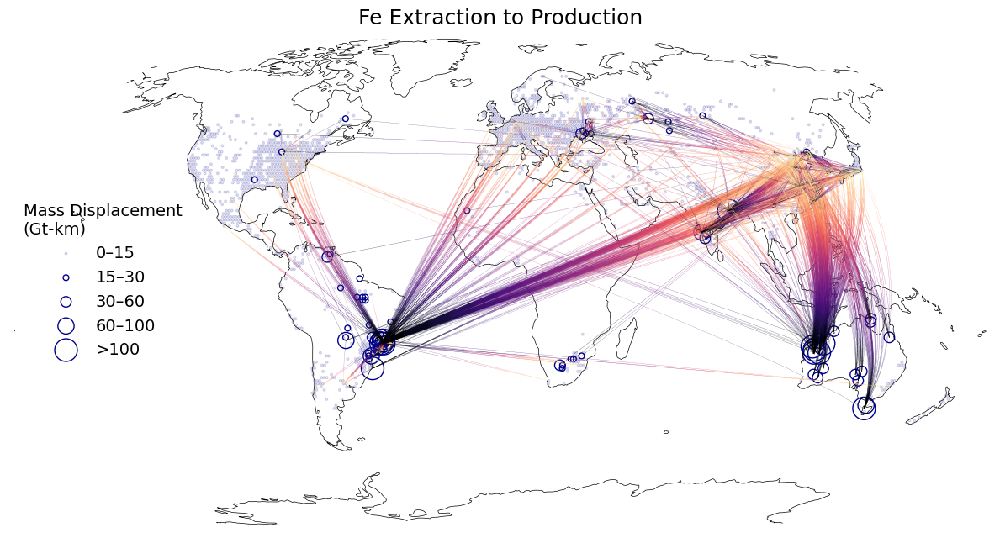

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14597.83
Edges after gravity calculation: 7469984
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7469984
IPF complete. Flow matrix generated with 7469984 edges.


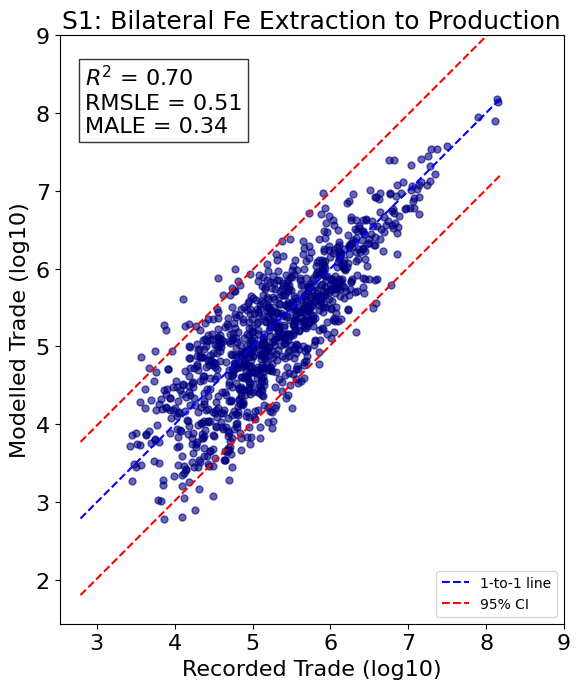

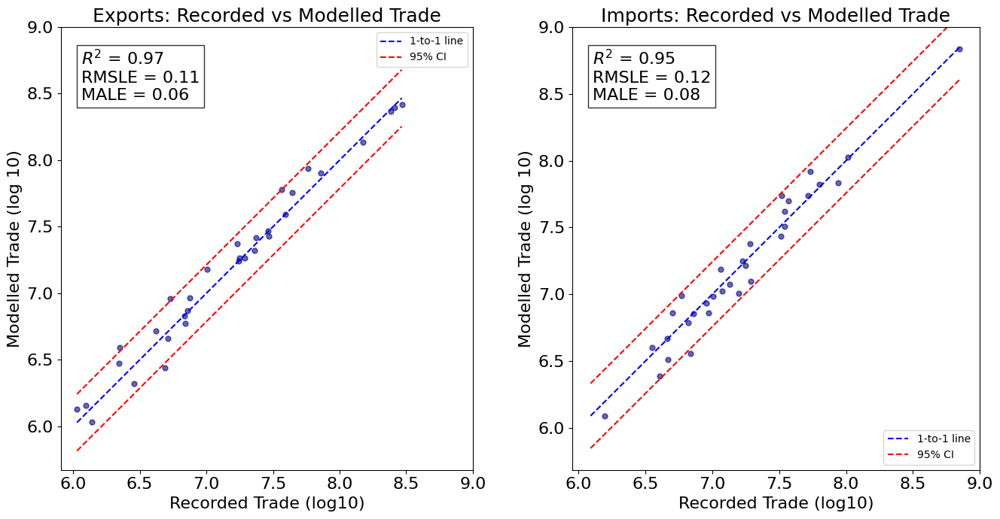

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s1_2010.nc
Top 1,500 edges cover 23.55% of total flow.
Map saved at: /Users/faisal/Documents/iESD/FeFlow/data/plot/network_map_s1_2010.png


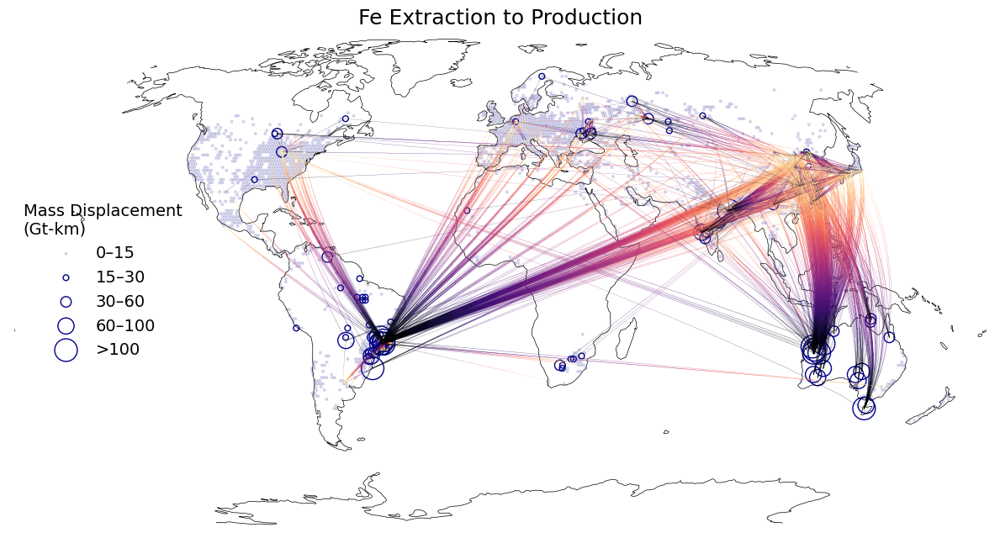

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14521.61
Edges after gravity calculation: 7523381
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7523381
IPF complete. Flow matrix generated with 7523381 edges.


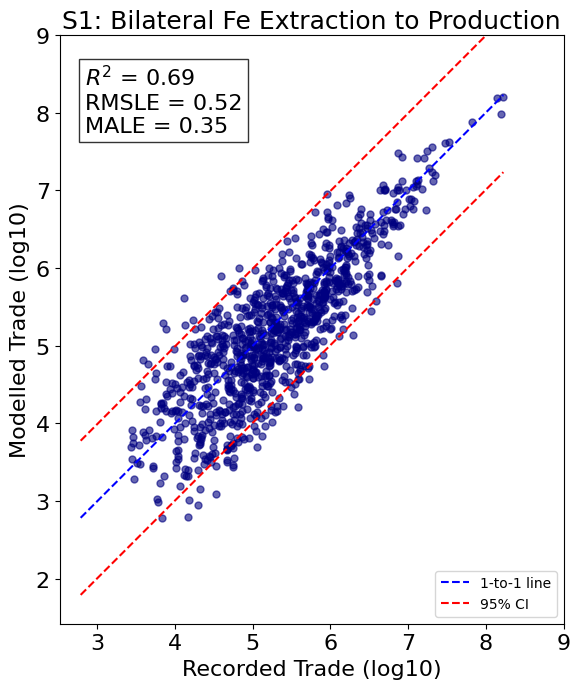

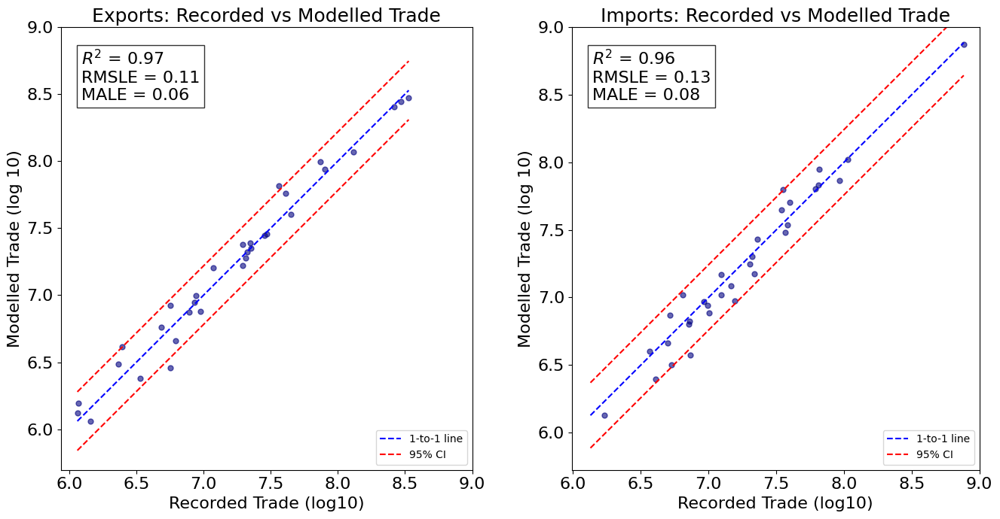

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s1_2011.nc
Top 1,500 edges cover 23.31% of total flow.
Map saved at: /Users/faisal/Documents/iESD/FeFlow/data/plot/network_map_s1_2011.png


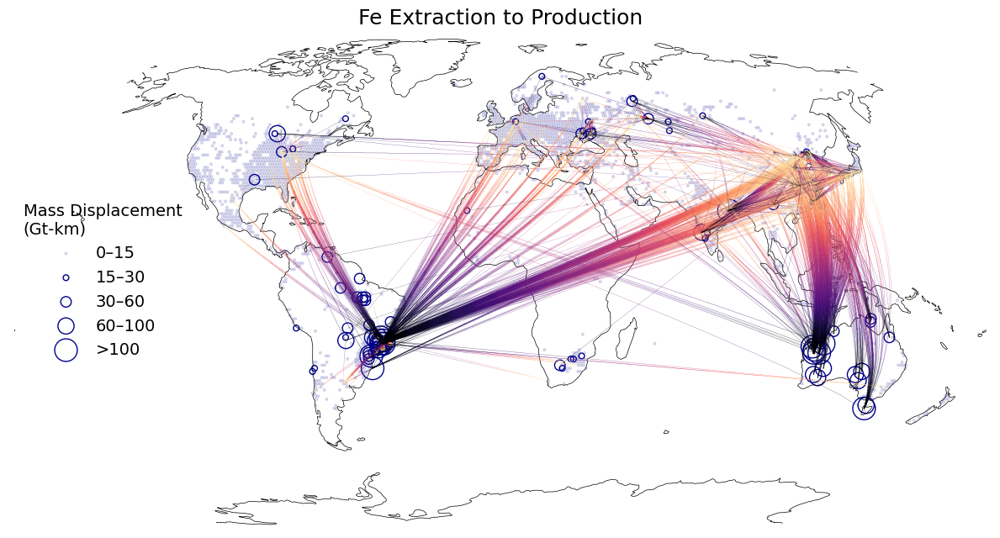

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14473.75
Edges after gravity calculation: 7578775
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7578775
IPF complete. Flow matrix generated with 7578775 edges.


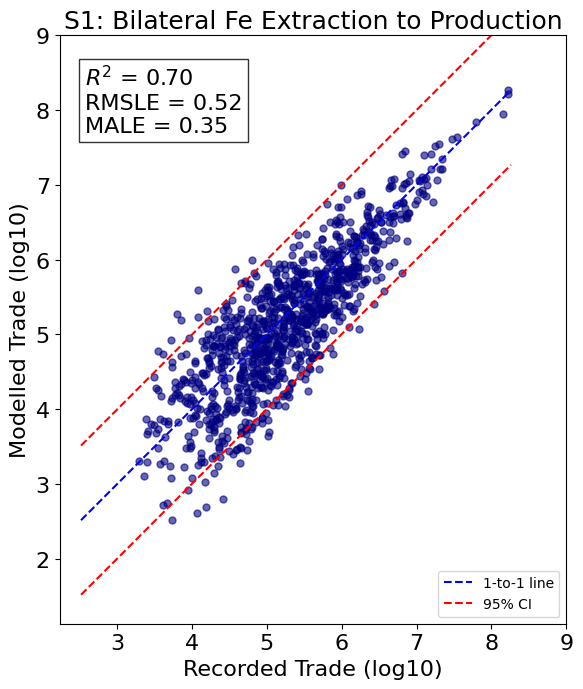

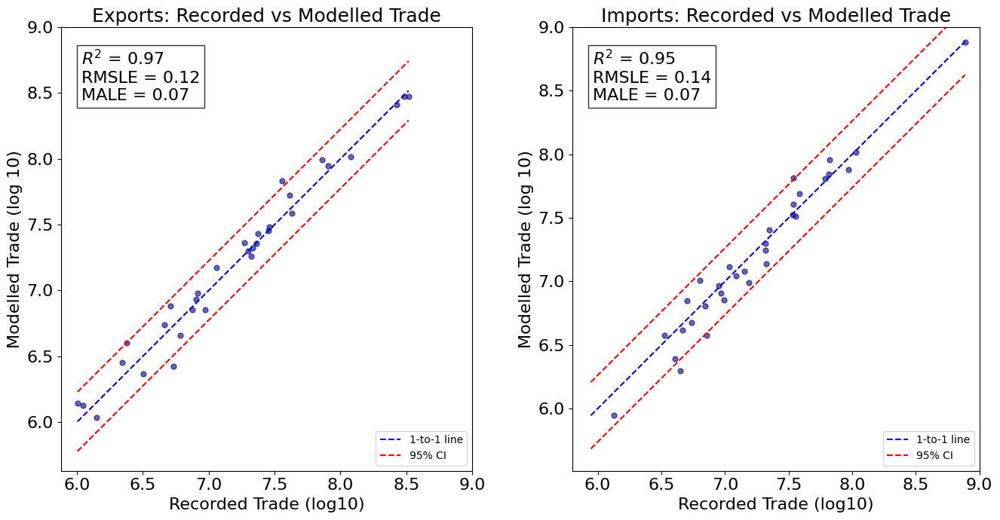

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s1_2012.nc
Top 1,500 edges cover 23.47% of total flow.
Map saved at: /Users/faisal/Documents/iESD/FeFlow/data/plot/network_map_s1_2012.png


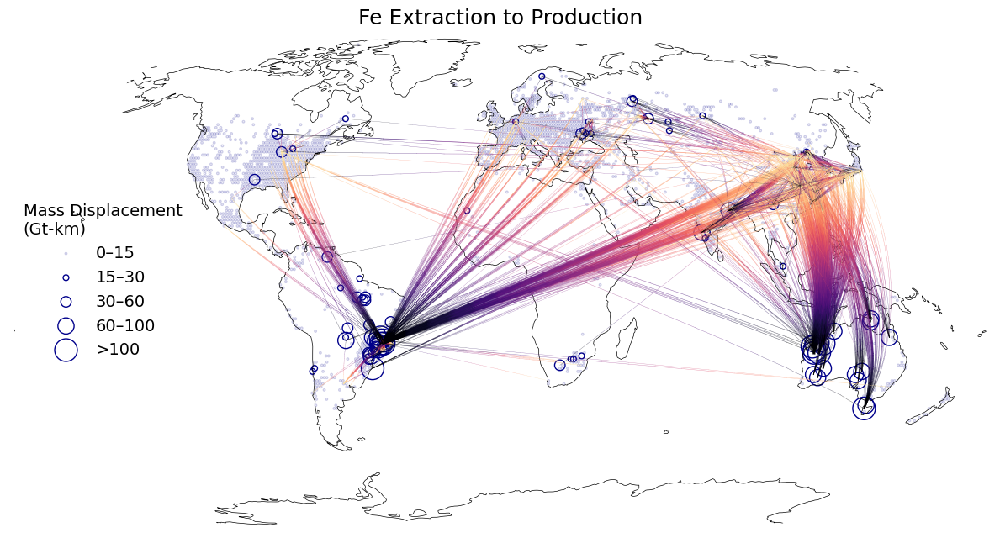

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14652.74
Edges after gravity calculation: 7747678
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7747678
IPF complete. Flow matrix generated with 7747678 edges.


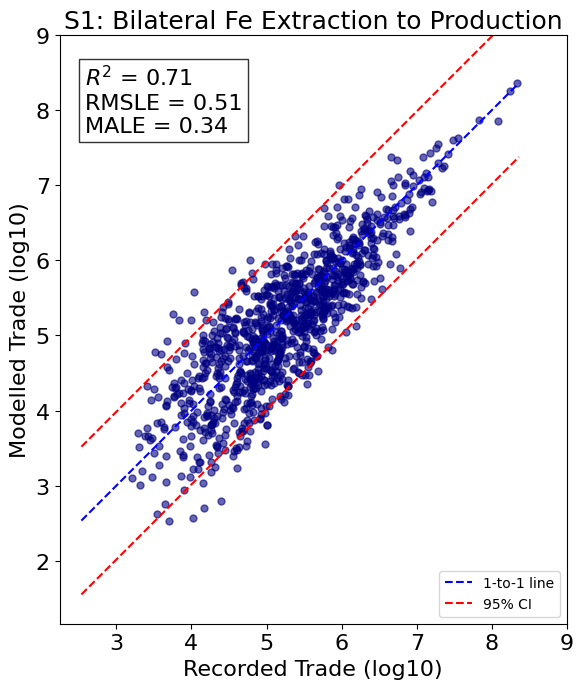

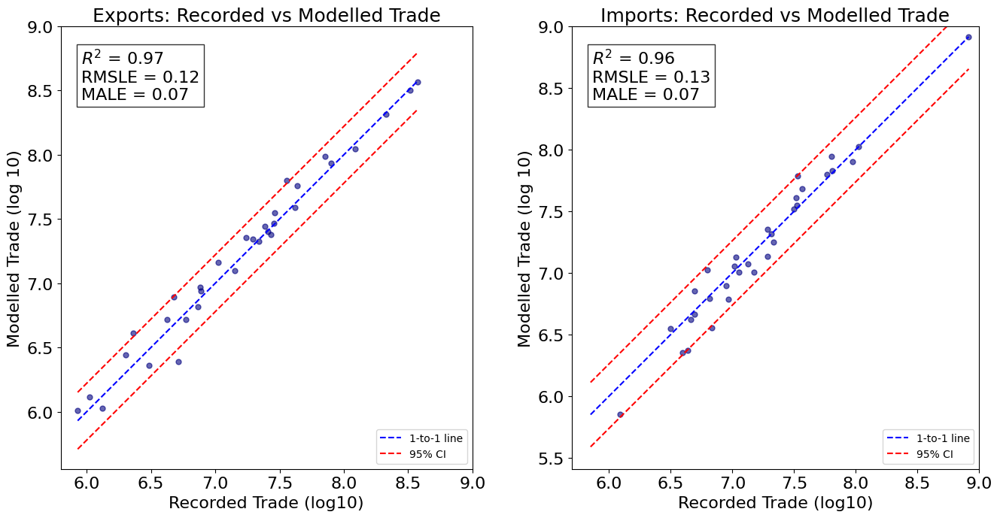

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s1_2013.nc
Top 1,500 edges cover 23.89% of total flow.
Map saved at: /Users/faisal/Documents/iESD/FeFlow/data/plot/network_map_s1_2013.png


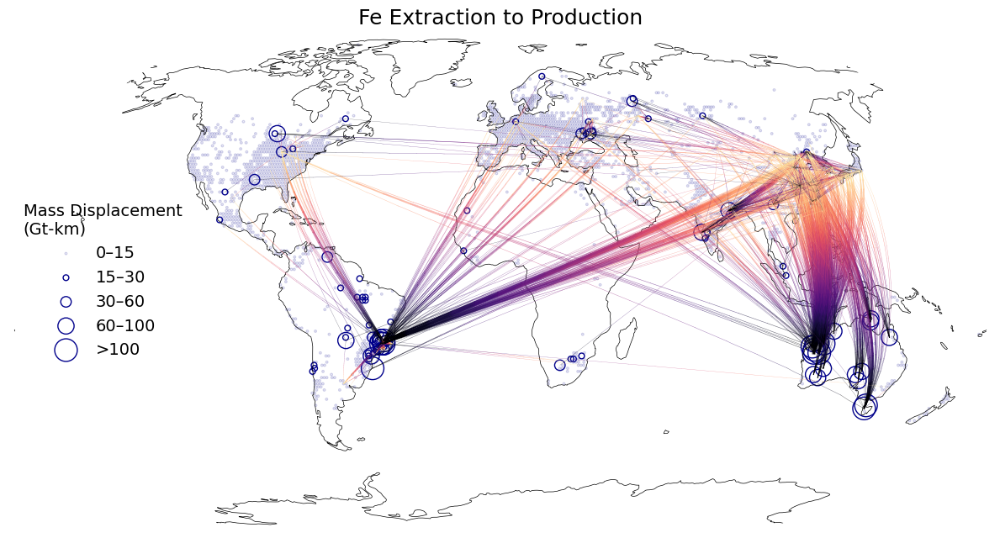

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14641.42
Edges after gravity calculation: 7838308
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7838308
IPF complete. Flow matrix generated with 7838308 edges.


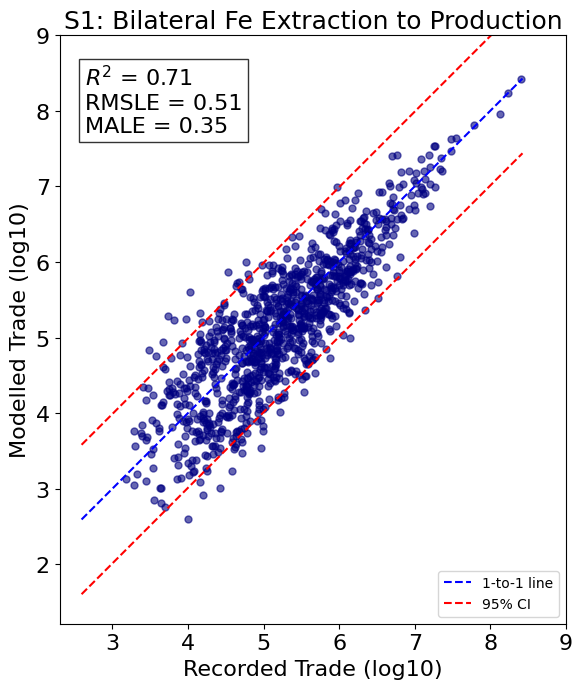

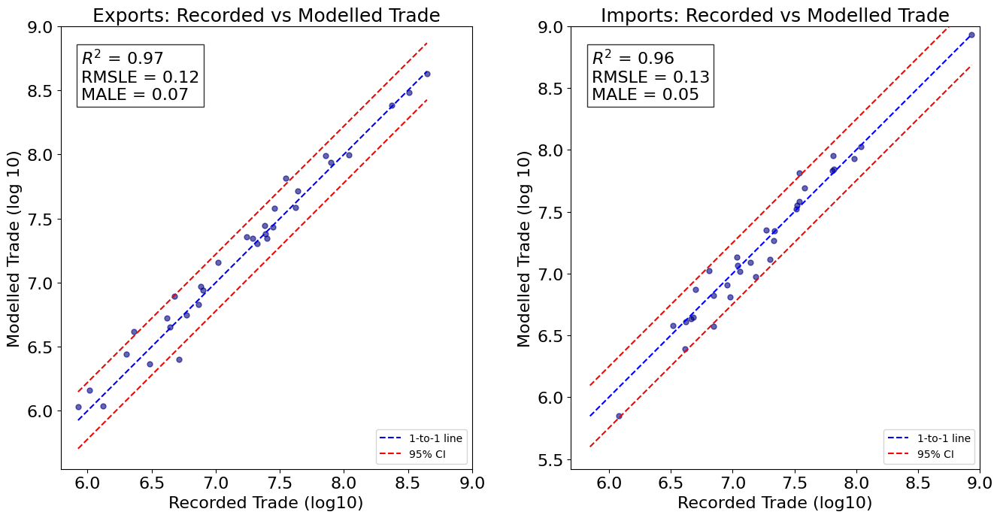

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s1_2014.nc
Top 1,500 edges cover 25.15% of total flow.
Map saved at: /Users/faisal/Documents/iESD/FeFlow/data/plot/network_map_s1_2014.png


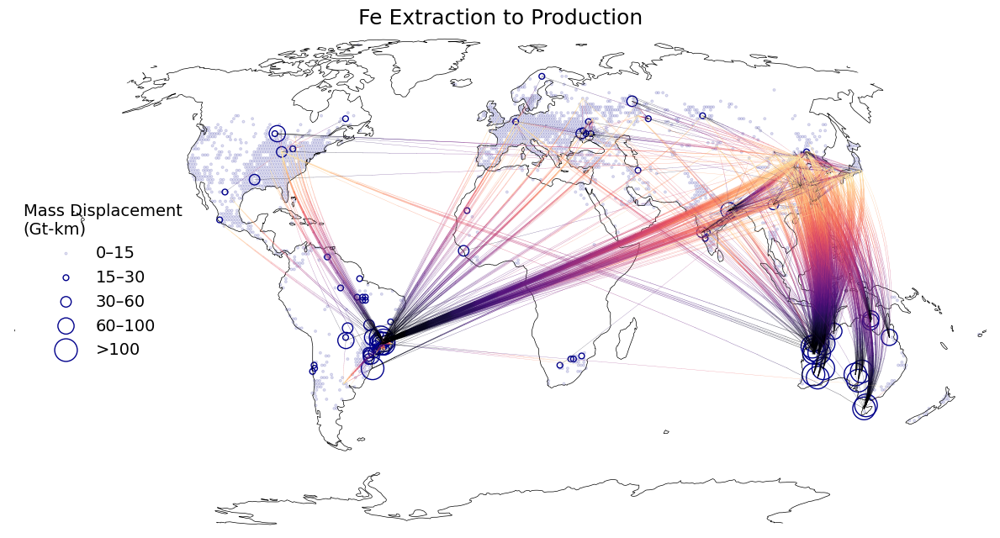

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14809.24
Edges after gravity calculation: 7896088
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7896088
IPF complete. Flow matrix generated with 7896088 edges.


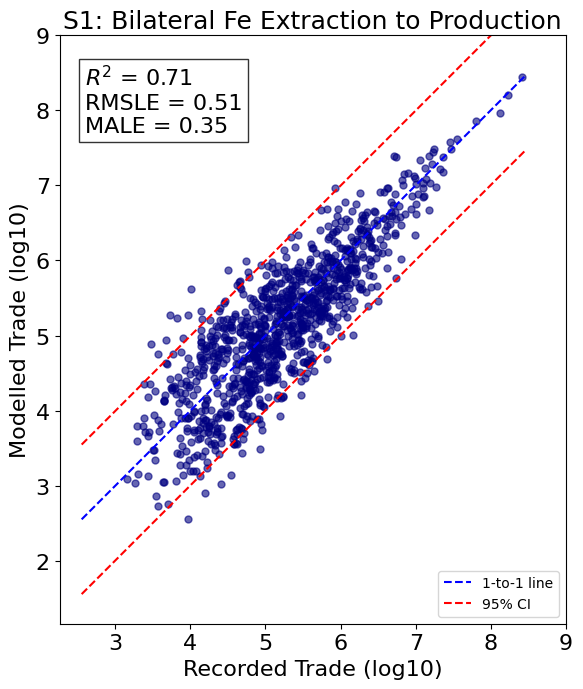

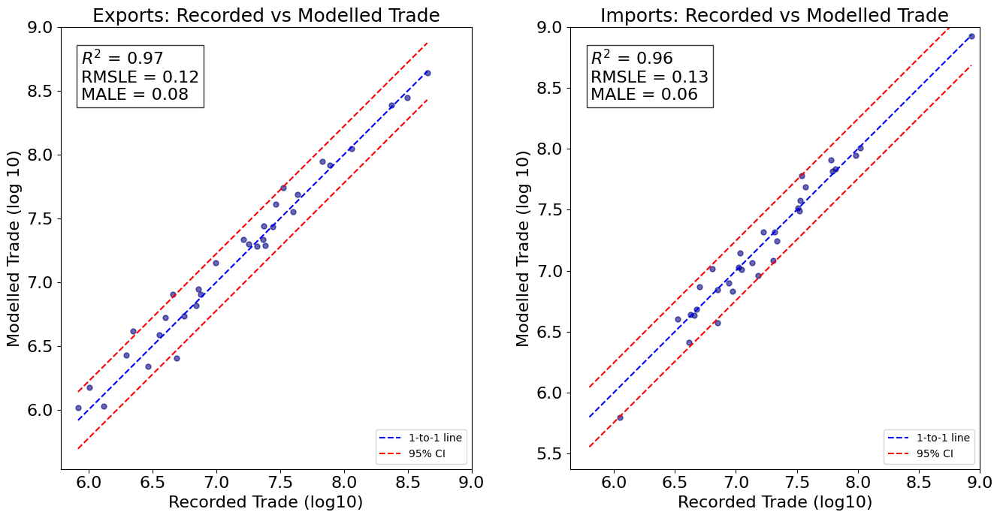

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s1_2015.nc
Top 1,500 edges cover 26.13% of total flow.
Map saved at: /Users/faisal/Documents/iESD/FeFlow/data/plot/network_map_s1_2015.png


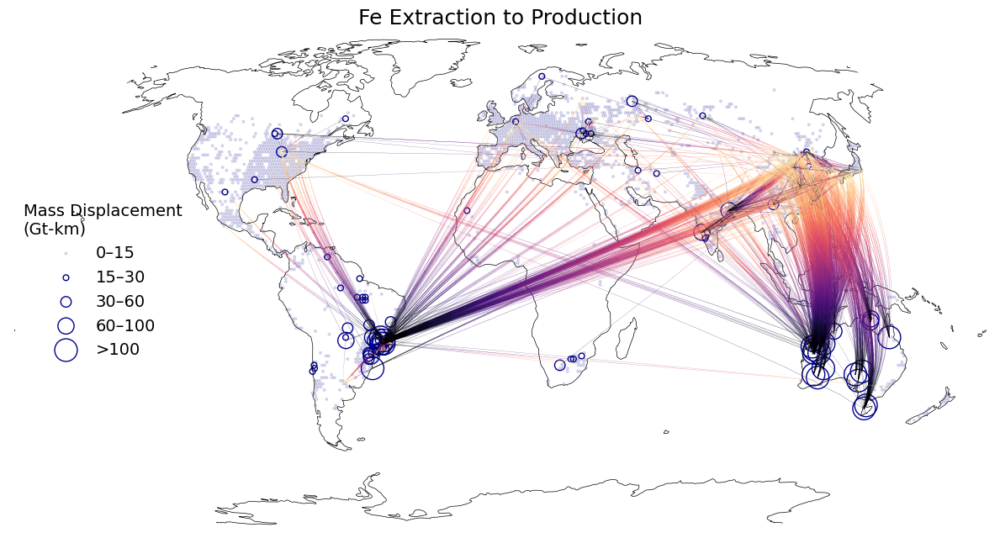

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14940.56
Edges after gravity calculation: 7965052
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7965052
IPF complete. Flow matrix generated with 7965052 edges.


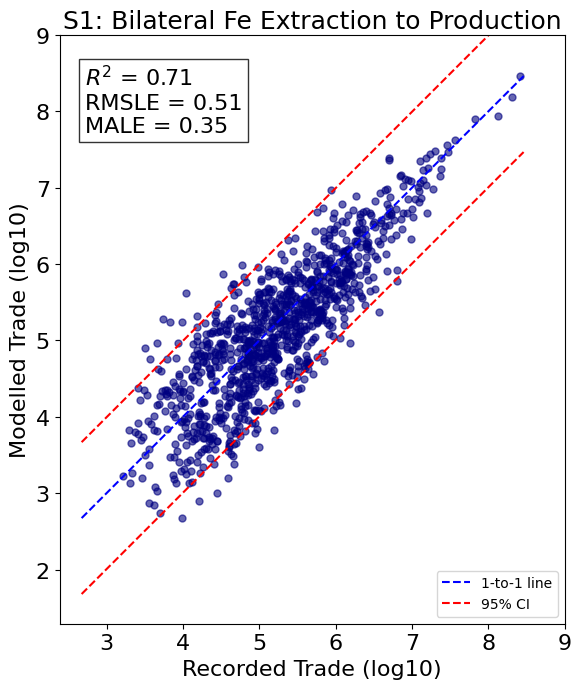

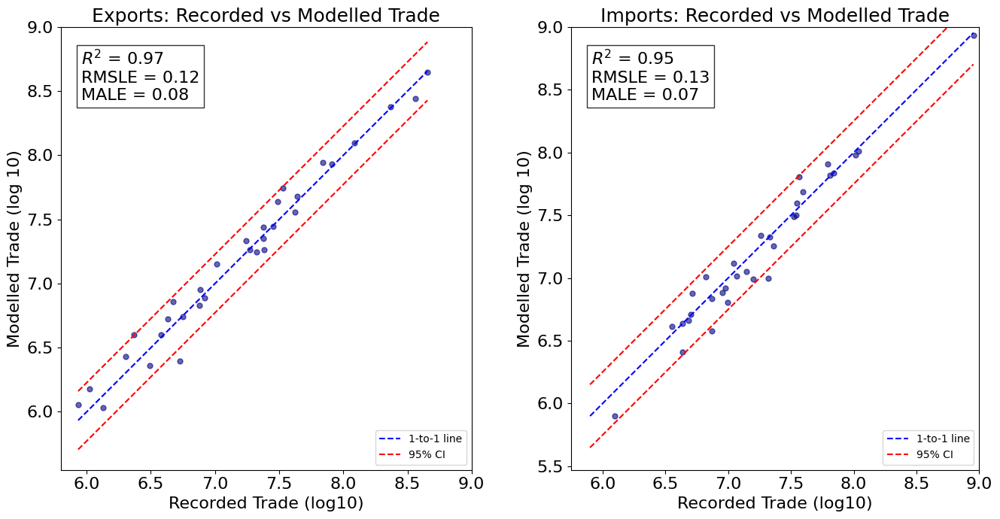

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s1_2016.nc
Top 1,500 edges cover 26.08% of total flow.
Map saved at: /Users/faisal/Documents/iESD/FeFlow/data/plot/network_map_s1_2016.png


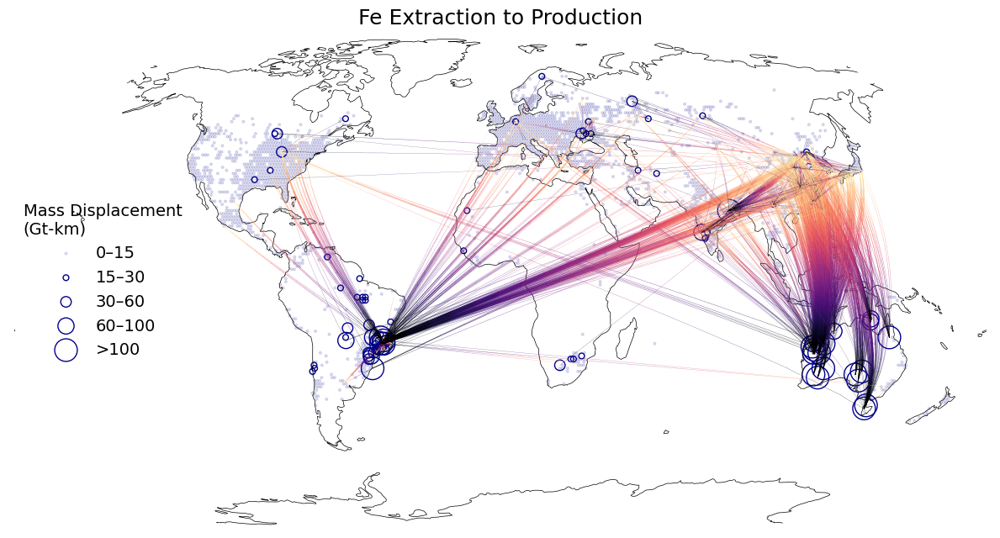

In [75]:
%load_ext autoreload
%autoreload 2

from FlowNetwork import FlowNetwork
import os
import pandas as pd

verbose = True

# Initialize the flow network with NetCDF data and variable names
grid_data_path = netcdf_path + 'L.T.iron_flows.2008-2016_adj.a.nc'
json_path = output_path + 'grouped_region.json'
bilateral_csv_path = output_path + 'iron_io_stage_1_adj.csv'
trade_tariff_path = raw_path + 'tariffsPairs_88_21_vbeta1-2024-12.csv'

bilateral_dfs = []
bilateral_metrics = []
regional_metrics = []
year_list = list(range(2008, 2017, 1))

for year in year_list:
    fn = FlowNetwork(grid_data_path, 'source_1_adj', 'sink_1_adj', time=year)
    fn.gravity_model(distance='tariff', threshold_percentile=100, trade_tariff_path=trade_tariff_path, year=year, tariff_weight_factor=2, verbose=True)
    fn.ipf_flows(max_iters=100, tol=1e-6, verbose=verbose)
    fn.bilateral_flow(year, json_path)
    df, metrics_bilateral = fn.validate_bilateral(bilateral_csv_path, year=year, column='tonnes_adj_1', x_log=True, y_log=True, title="S1: Bilateral Fe Extraction to Production", x_label="Recorded Trade (log10)", y_label="Modelled Trade (log10)", fontsize=16, xmax=9, ymax=9, output_dir=plot_path, filename=f"bilateral_trade_s1_{year}.pdf")
    df.to_csv(f"model_output_s1_{year}.csv", index=False)
    metrics_regional = fn.regional_trade_comparison(x_log=True, y_log=True, title="Recorded vs Modelled Trade", x_label="Recorded Trade (log10)", y_label="Modelled Trade (log 10)", fontsize=16, xmax=9, ymax=9, rm_outliers=False, output_dir=plot_path, filename=f"regional_trade_s1_{year}.pdf")
    fn.save_to_netcdf(output_dir=netcdf_path, filename=f"gravity_model_output_s1_{year}.nc")
    fn.mass_displacement(output_dir=netcdf_path, filename=f"gravity_mass_displacement_s1_{year}.nc")
    fn.plot_network_map(title="Fe Extraction to Production", radius=3, color="darkblue", bins=[0.1, 15, 30, 60, 100, np.inf], labels=['0–15', '15–30', '30–60', '60–100', '>100'], num_edges=1500, edge_alpha=0.6, edge_cmap="magma", steps=20, output_dir=plot_path, filename=f"network_map_s1_{year}.png")
    bilateral_metrics.append(metrics_bilateral)
    regional_metrics.append(metrics_regional)
    bilateral_dfs.append(df)

merged_bilateral = pd.concat(bilateral_metrics)
merged_regional = pd.concat(regional_metrics)
merged_regional_dfs = pd.concat(bilateral_dfs)

merged_bilateral.to_csv(output_path + "bilateral_validation_s1.csv", index=False)
merged_regional.to_csv(output_path + "regional_validation_s1.csv", index=False)
merged_regional_dfs.to_csv(output_path + "model_output_s1.csv", index=False)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 16352.73
Edges after gravity calculation: 7313731
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7313731
IPF complete. Flow matrix generated with 7313731 edges.


UnboundLocalError: cannot access local variable 'rmsle' where it is not associated with a value

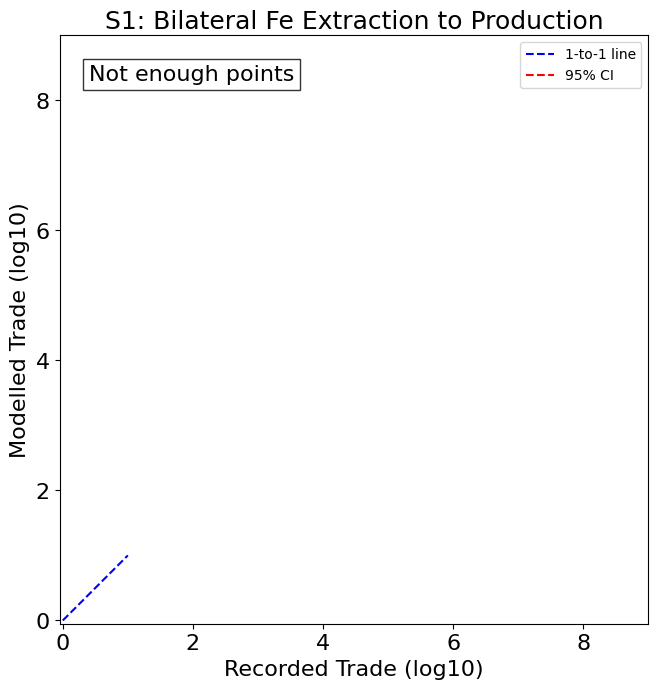

In [59]:
%load_ext autoreload
%autoreload 2

from FlowNetwork import FlowNetwork
import os
import pandas as pd

verbose = True

# Initialize the flow network with NetCDF data and variable names
grid_data_path = netcdf_path + 'L.T.iron_flows.2008-2016_adj.a.nc'
json_path = output_path + 'grouped_region.json'
bilateral_csv_path = output_path + 'iron_io_stage_1_adj.csv'
trade_tariff_path = raw_path + 'tariffsPairs_88_21_vbeta1-2024-12.csv'

bilateral_dfs = []
bilateral_metrics = []
regional_metrics = []
year_list = list(range(2008, 2017, 1))

for year in year_list:
    fn = FlowNetwork(grid_data_path, 'source_1_adj', 'sink_1_adj', time=year)
    fn.gravity_model(distance='tariff', threshold_percentile=100, trade_tariff_path=trade_tariff_path, year=year, tariff_weight_factor=2, verbose=True)
    fn.ipf_flows(max_iters=100, tol=1e-6, verbose=verbose)
    fn.bilateral_flow(year, json_path)    
    df, metrics_bilateral = fn.validate_bilateral(bilateral_csv_path, year=2016, column='tonnes_adj_1', x_log=True, y_log=True, title="S1: Bilateral Fe Extraction to Production", x_label="Recorded Trade (log10)", y_label="Modelled Trade (log10)", fontsize=16, xmax=9, ymax=9)
    metrics_regional = fn.regional_trade_comparison(x_log=True, y_log=True, title="Recorded vs Modelled Trade", x_label="Recorded Trade (log10)", y_label="Modelled Trade (log 10)", fontsize=16, xmax=9, ymax=9, rm_outliers=False, output_dir=plot_path, filename=f"regional_trade_s1_{year}.pdf")
    fn.save_to_netcdf(output_dir=netcdf_path, filename=f"gravity_model_output_s1_{year}.nc")
    fn.mass_displacement(output_dir=netcdf_path, filename=f"gravity_mass_displacement_s1_{year}.nc")
    fn.plot_network_map(title="Fe Extraction to Production", radius=3, color="darkblue", bins=[0.1, 15, 30, 60, 100, np.inf], labels=['0–15', '15–30', '30–60', '60–100', '>100'], num_edges=1500, edge_alpha=0.6, edge_cmap="magma", steps=20, output_dir=plot_path, filename=f"network_map_s1_{year}.png")
    bilateral_metrics.append(metrics_bilateral)
    regional_metrics.append(metrics_regional)
    bilateral_dfs.append(df)

merged_bilateral = pd.concat(bilateral_metrics)
merged_regional = pd.concat(regional_metrics)
merged_regional_dfs = pd.concat(bilateral_dfs)

merged_bilateral.to_csv(output_path + "bilateral_validation_s1.csv", index=False)
merged_regional.to_csv(output_path + "regional_validation_s1.csv", index=False)
merged_regional_dfs.to_csv(output_path + "model_output_s1.csv", index=False)

# Stage 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 16728.40
Edges after gravity calculation: 7305902
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7305902
IPF complete. Flow matrix generated with 7305902 edges.


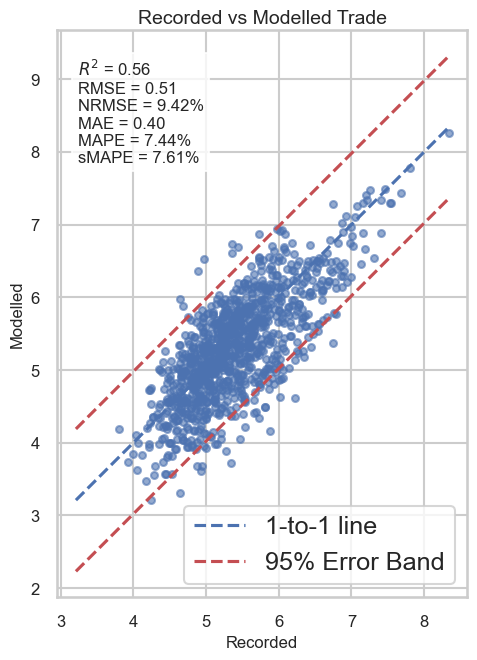

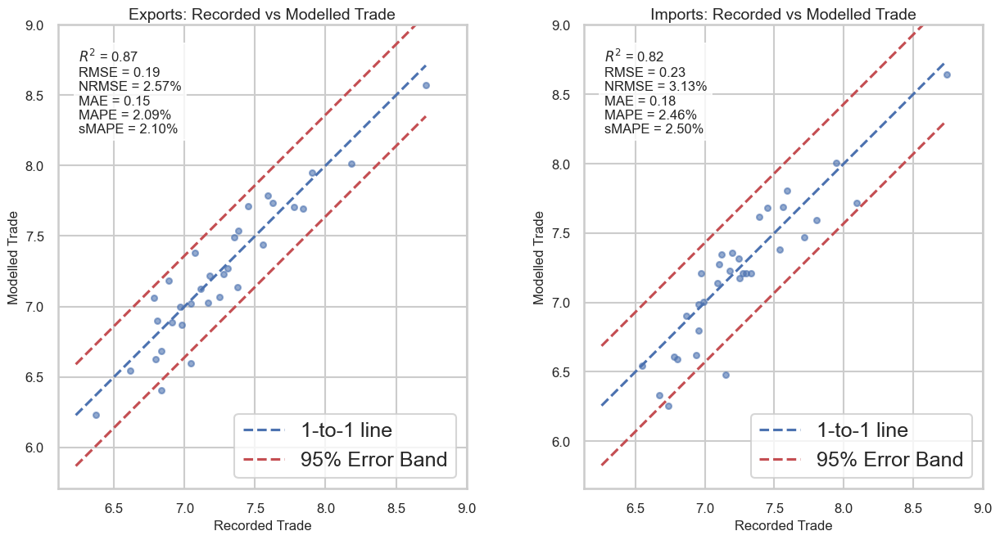

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s2_2008.nc
Top 3,000 edges cover 16.83% of total flow.


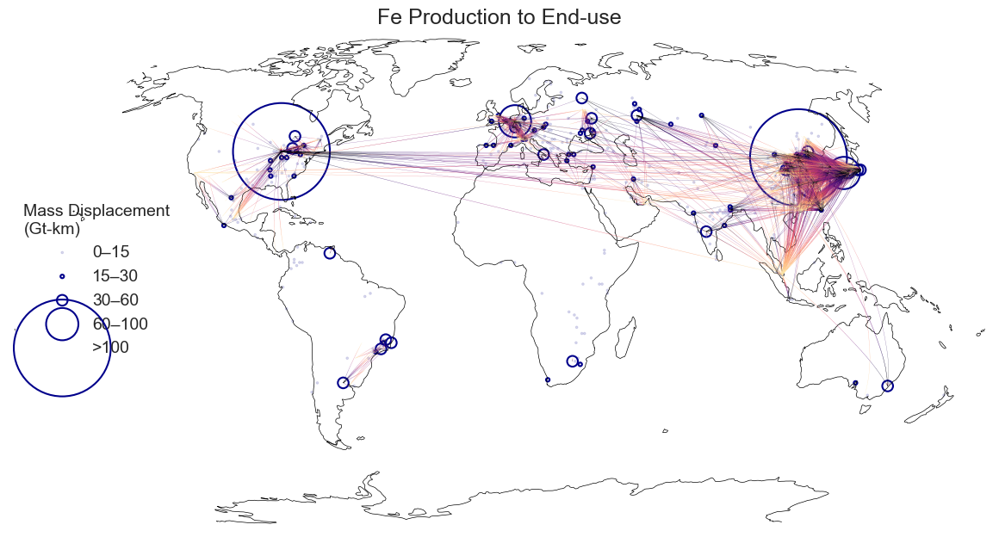

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 15247.89
Edges after gravity calculation: 7403874
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7403874
IPF complete. Flow matrix generated with 7403874 edges.


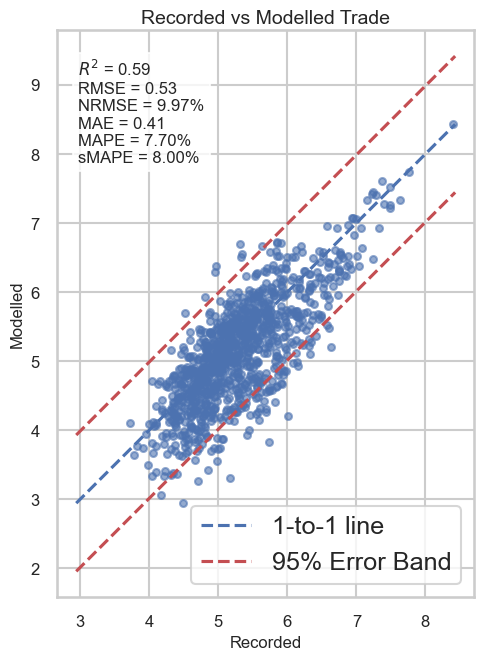

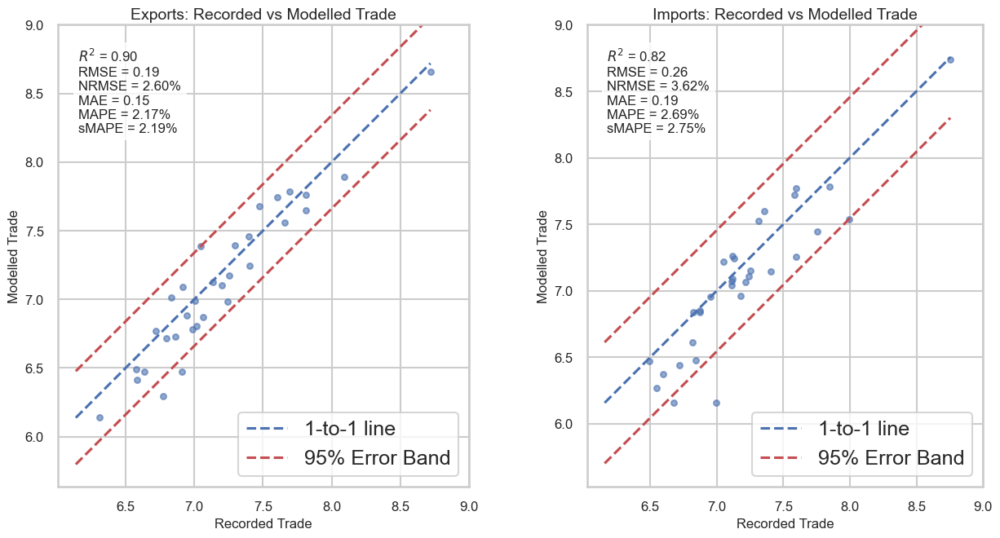

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s2_2009.nc
Top 3,000 edges cover 18.30% of total flow.


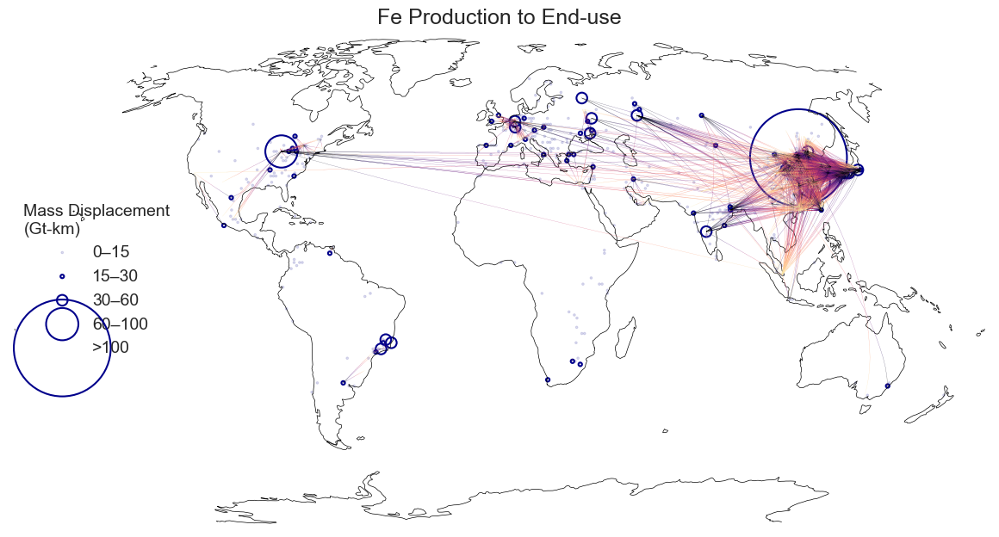

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14788.78
Edges after gravity calculation: 7461990
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7461990
IPF complete. Flow matrix generated with 7461990 edges.


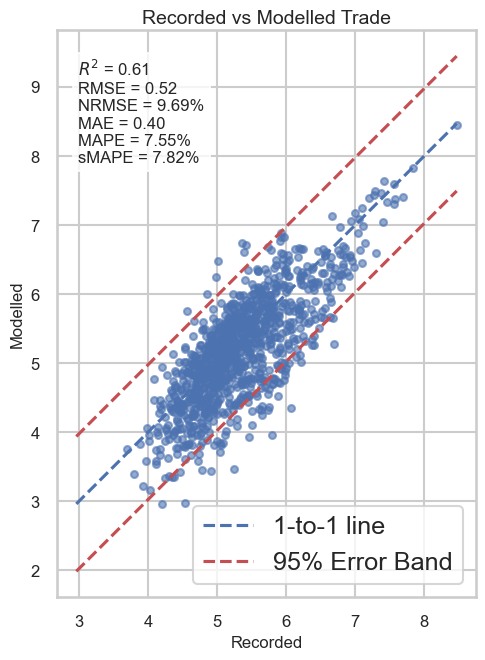

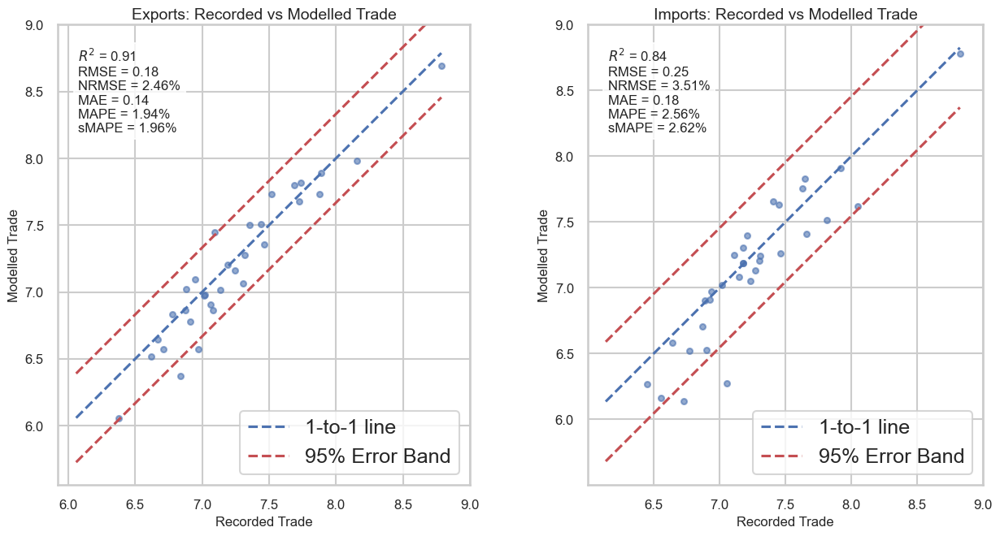

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s2_2010.nc
Top 3,000 edges cover 17.35% of total flow.


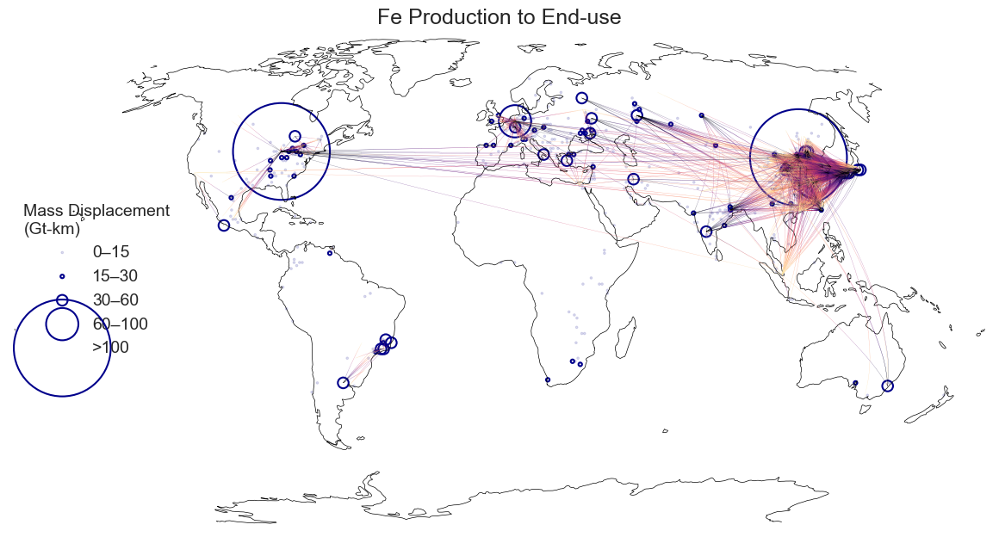

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14744.36
Edges after gravity calculation: 7515312
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7515312
IPF complete. Flow matrix generated with 7515312 edges.


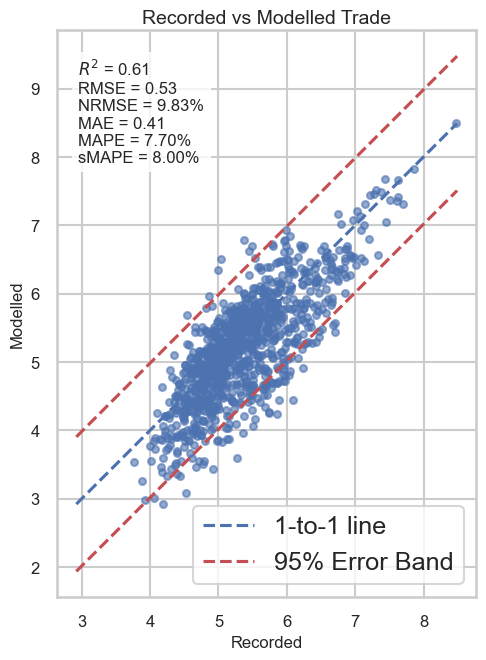

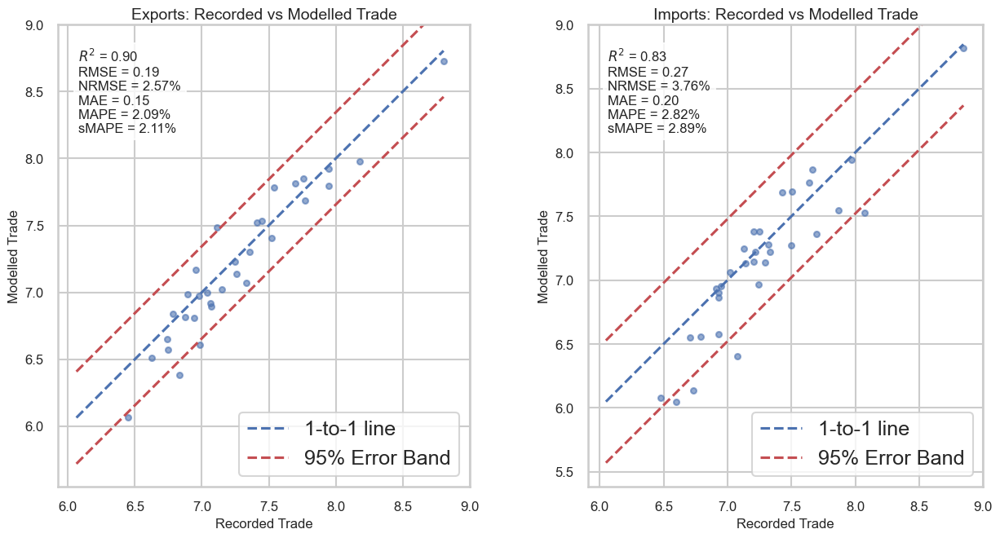

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s2_2011.nc
Top 3,000 edges cover 17.48% of total flow.


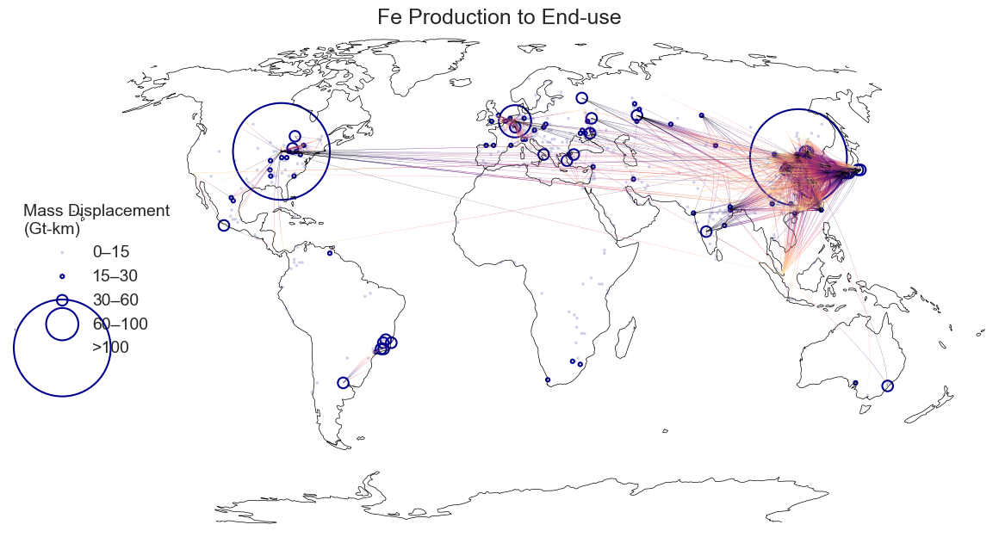

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14765.16
Edges after gravity calculation: 7570646
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7570646
IPF complete. Flow matrix generated with 7570646 edges.


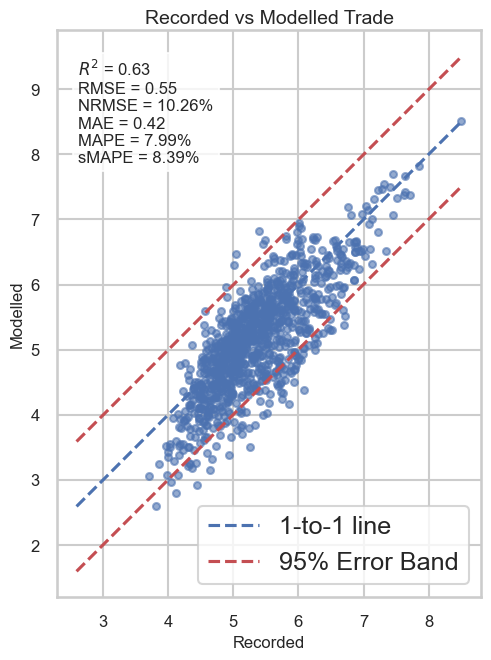

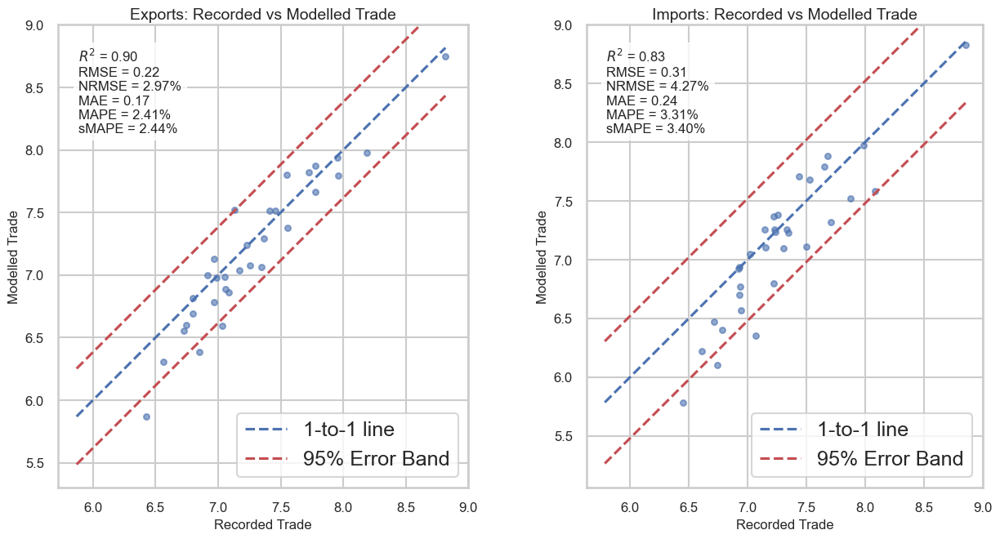

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s2_2012.nc
Top 3,000 edges cover 17.49% of total flow.


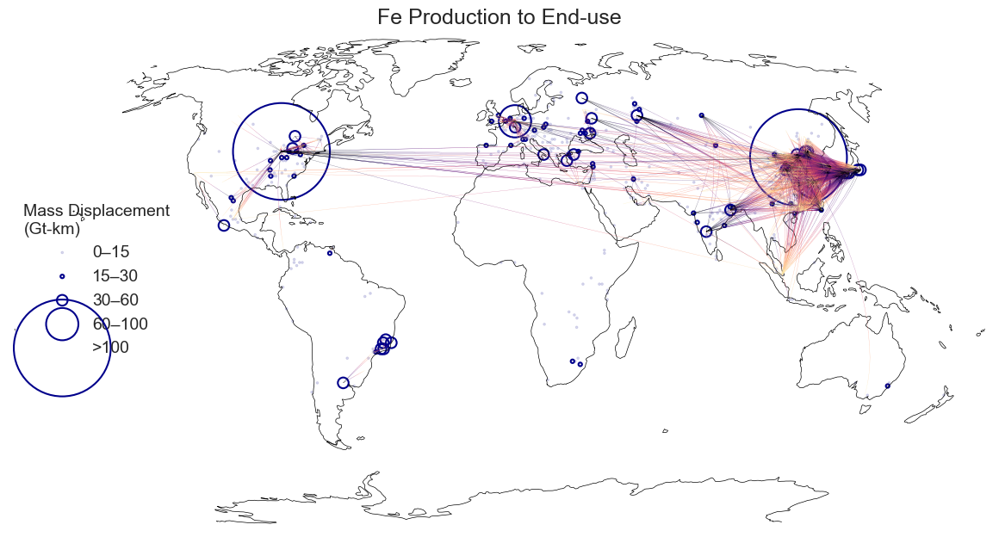

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14814.35
Edges after gravity calculation: 7739369
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7739369
IPF complete. Flow matrix generated with 7739369 edges.


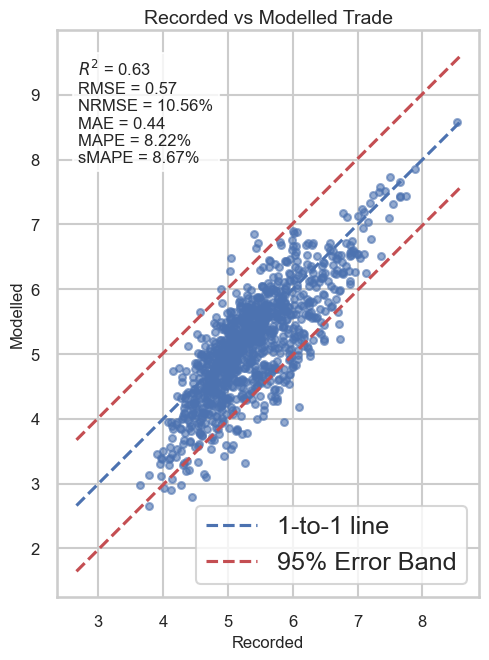

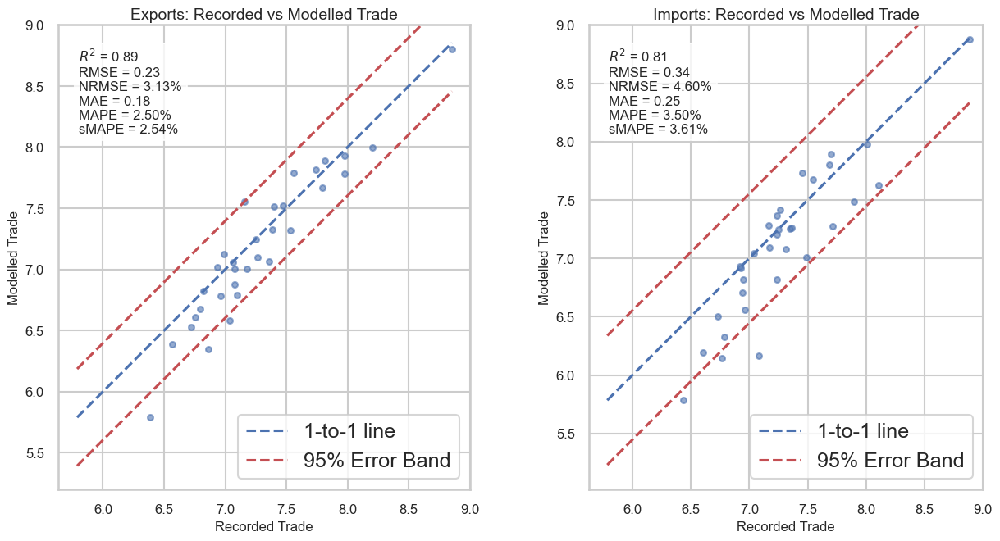

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s2_2013.nc
Top 3,000 edges cover 18.15% of total flow.


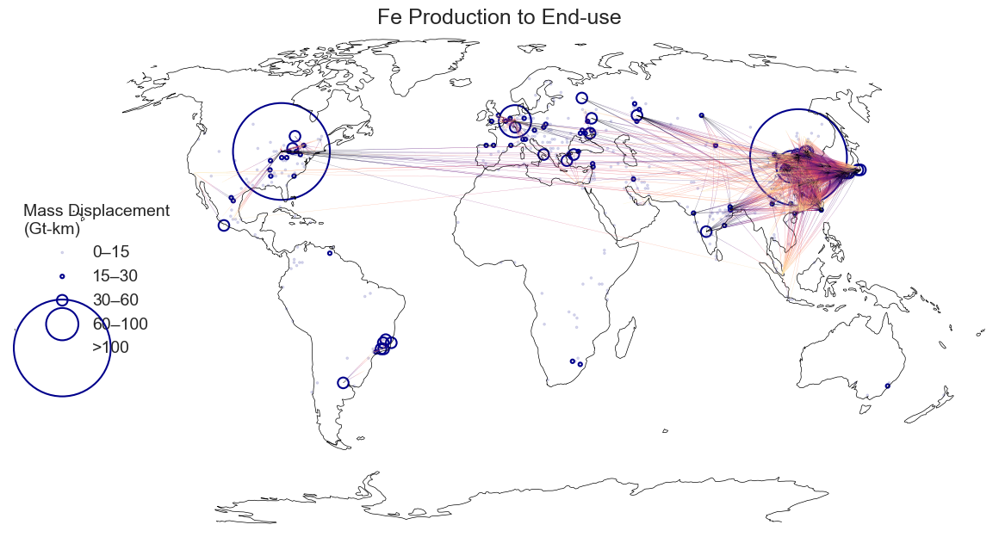

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14827.63
Edges after gravity calculation: 7829909
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7829909
IPF complete. Flow matrix generated with 7829909 edges.


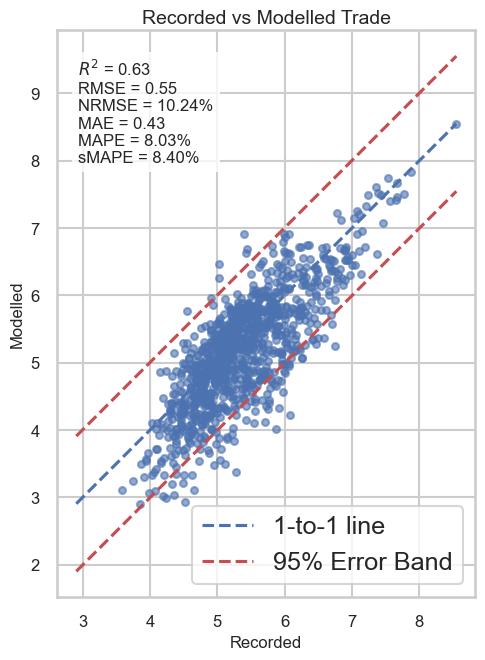

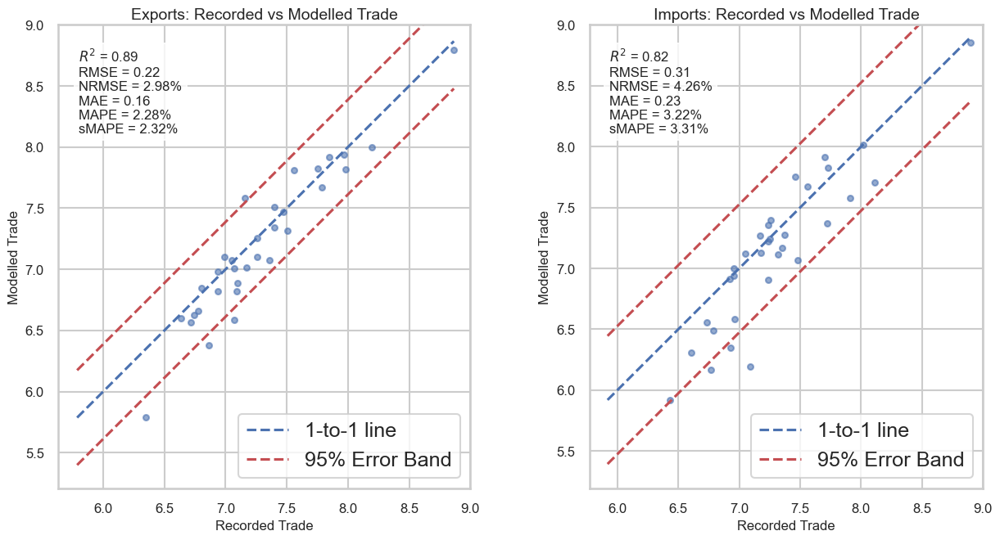

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s2_2014.nc
Top 3,000 edges cover 17.70% of total flow.


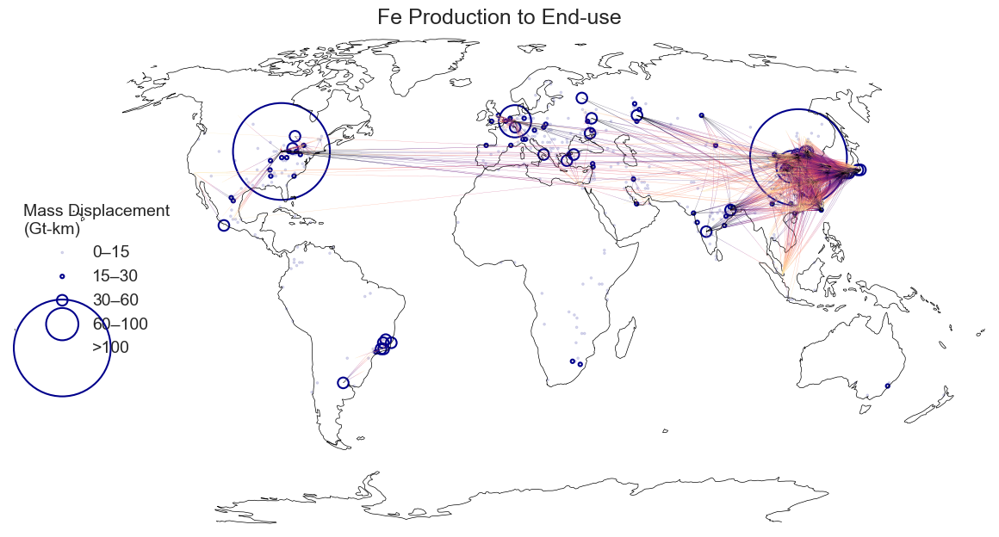

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 15096.34
Edges after gravity calculation: 7887659
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7887659
IPF complete. Flow matrix generated with 7887659 edges.


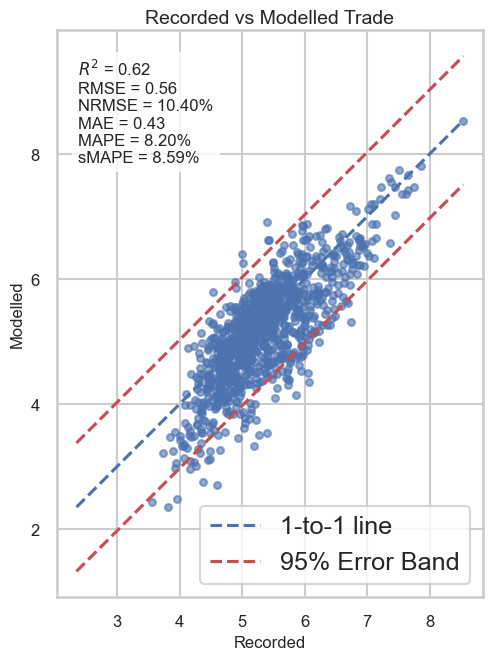

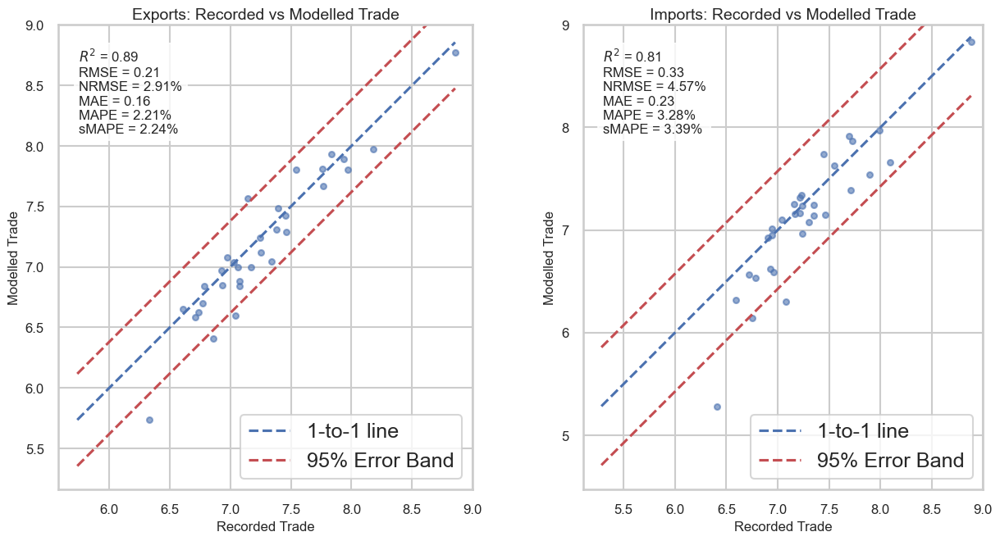

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s2_2015.nc
Top 3,000 edges cover 17.49% of total flow.


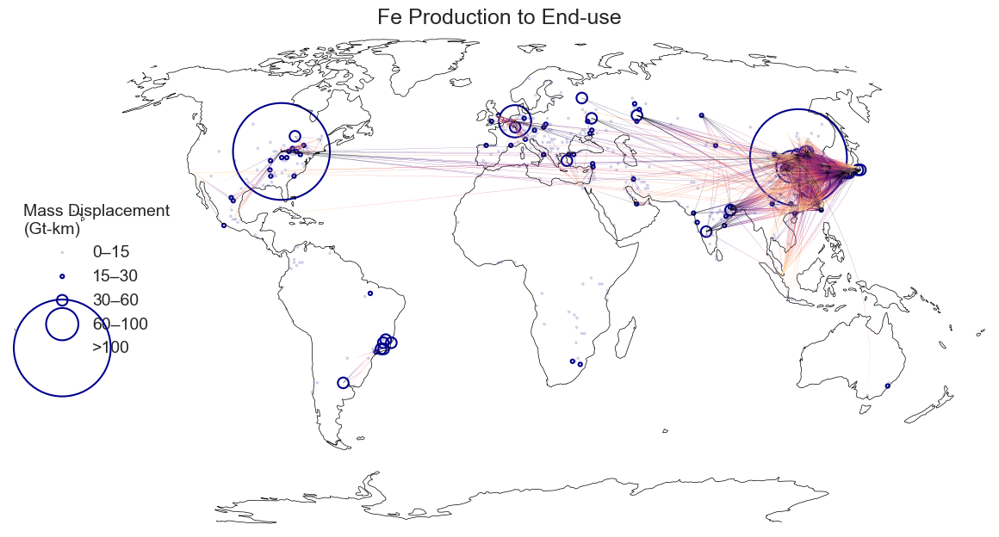

Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 15161.50
Edges after gravity calculation: 7956533
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7956533
IPF complete. Flow matrix generated with 7956533 edges.


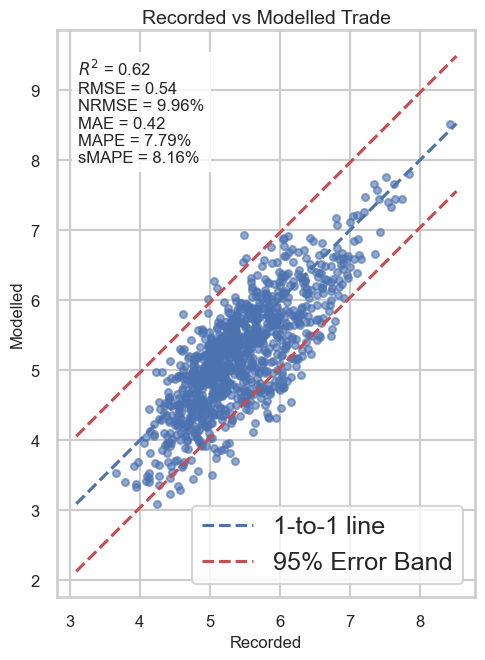

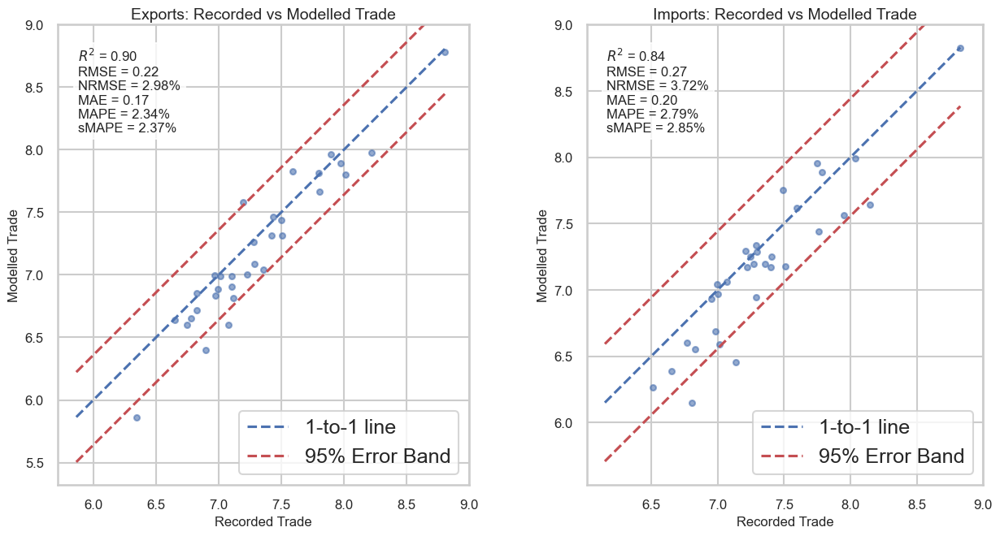

NetCDF file saved to: /Users/faisal/Documents/iESD/FeFlow/data/netcdf/gravity_model_output_s2_2016.nc
Top 3,000 edges cover 17.27% of total flow.


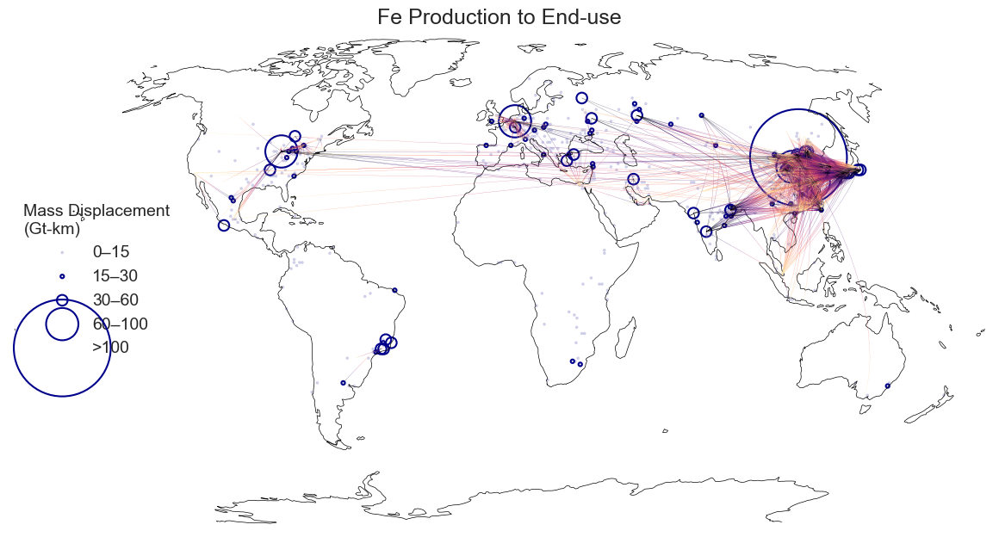

In [171]:
%load_ext autoreload
%autoreload 2

from FlowNetwork import FlowNetwork
import os
import pandas as pd

verbose = True

# Initialize the flow network with NetCDF data and variable names
grid_data_path = netcdf_path + 'L.T.iron_flows.2008-2016_adj.a.nc'
json_path = output_path + 'grouped_region.json'
bilateral_csv_path = output_path + 'iron_io_stage_2_adj.csv'
trade_tariff_path = raw_path + 'tariffsPairs_88_21_vbeta1-2024-12.csv'

bilateral_dfs = []
bilateral_metrics = []
regional_metrics = []
year_list = list(range(2008, 2017, 1))

for year in year_list:
    fn = FlowNetwork(grid_data_path, 'source_2_adj', 'sink_2_adj', time=year)
    fn.gravity_model(distance='tariff', threshold_percentile=100, trade_tariff_path=trade_tariff_path, year=year, tariff_weight_factor=2, verbose=True)
    fn.ipf_flows(max_iters=100, tol=1e-6, verbose=verbose)
    fn.bilateral_flow(year, json_path)
    df, metrics_bilateral = fn.validate_bilateral(bilateral_csv_path, year=year, column='tonnes_adj_2', x_log=True, y_log=True, rm_outliers=False)
    metrics_regional = fn.regional_trade_comparison(x_log=True, y_log=True, title="Recorded vs Modelled Trade", x_label="Recorded Trade", y_label="Modelled Trade", fontsize=12, xmax=9, ymax=9, rm_outliers=False, output_dir=plot_path, filename=f"regional_trade_s2_{year}.pdf")
    fn.save_to_netcdf(output_dir=netcdf_path, filename=f"gravity_model_output_s2_{year}.nc")
    fn.mass_displacement(output_dir=netcdf_path, filename=f"gravity_mass_displacement_s2_{year}.nc")
    fn.plot_network_map(title="Fe Production to End-use", radius=3, color="darkblue", bins=[0, 15, 30, 60, 100, np.inf], labels=['0–15', '15–30', '30–60', '60–100', '>100'], num_edges=3000, edge_alpha=0.6, edge_cmap="magma", steps=20, output_dir=plot_path, filename=f"network_map_s2_{year}.pdf")
    bilateral_metrics.append(metrics_bilateral)
    regional_metrics.append(metrics_regional)
    bilateral_dfs.append(df)

merged_bilateral = pd.concat(bilateral_metrics)
merged_regional = pd.concat(regional_metrics)
merged_regional_dfs = pd.concat(bilateral_dfs)

merged_bilateral.to_csv(output_path + "bilateral_validation_s2.csv", index=False)
merged_regional.to_csv(output_path + "regional_validation_s2.csv", index=False)
merged_regional_dfs.to_csv(output_path + "model_output_s2.csv", index=False)

# Analysis

In [61]:
nc_lists = glob.glob(netcdf_path + "gravity_mass_displacement*")

## add lat and lon attributes
lon_attr = {"units" : "degrees_east",
        "modulo" : 360.,
        "point_spacing" : "even",
        "axis" : "X"}

lat_attr = {"units" : "degrees_north",
            "point_spacing" : "even",
            "axis" : "Y"}

time_attr = {
        "standard_name": "time",
        "axis": "T"}

global_attr = {'Project': 'Surface Earth System Analysis and Modeling Environment (SESAME)',
               'Research Group': 'Integrated Earth System Dynamics',
               'Institution': 'McGill University',
               'Contact': 'eric.galbraith@mcgill.ca \nabdullah-al.faisal@mail.mcgill.ca',
               'Data Version': 'V2.0'}

dataset_list = []

for nc in nc_lists:
    stage = (nc.split("/")[-1]).split("_")[-2]
    year = ((nc.split("/")[-1]).split("_")[-1]).split(".")[0]
    ds = xr.open_dataset(nc)
    time_coord = np.datetime64(f"{year}-01-01")
    ds = ds.expand_dims(time=[time_coord])
    ds['lon'].attrs = lon_attr
    ds['lat'].attrs = lat_attr
    ds['time'].attrs = time_attr
    if stage == "s1":
        ds = ds.rename({'mass_displacement' : 'mass_disp_ex2p'})
        ds['mass_disp_ex2p'].attrs = {'long_name': 'Fe Extraction to Production Mass Displacement = sum(flow × distance) from each origin cell', 'units': 'tonne-km'}
    else:
        ds = ds.rename({'mass_displacement' : 'mass_disp_p2ed'})
        ds['mass_disp_p2ed'].attrs = {'long_name': 'Fe Production to End-use Mass Displacement = sum(flow × distance) from each origin cell', 'units': 'tonne-km'}
    dataset_list.append(ds)
    
merged_ds = xr.merge(dataset_list)
merged_ds.attrs = global_attr
merged_ds.to_netcdf(netcdf_path + "Fe.mass_displacement.2008-2016.a.nc")
merged_ds

<xarray.Dataset> Size: 9MB
Dimensions:         (lon: 360, lat: 180, time: 9)
Coordinates:
  * lon             (lon) float64 3kB -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
  * lat             (lat) float64 1kB -89.5 -88.5 -87.5 -86.5 ... 87.5 88.5 89.5
  * time            (time) datetime64[s] 72B 2008-01-01 ... 2016-01-01
Data variables:
    mass_disp_ex2p  (time, lat, lon) float64 5MB nan nan nan nan ... nan nan nan
    mass_disp_p2ed  (time, lat, lon) float64 5MB nan nan nan nan ... nan nan nan
Attributes:
    Project:         Surface Earth System Analysis and Modeling Environment (...
    Research Group:  Integrated Earth System Dynamics
    Institution:     McGill University
    Contact:         eric.galbraith@mcgill.ca \nabdullah-al.faisal@mail.mcgil...
    Data Version:    V2.0

In [95]:
ds_mass_disp = xr.open_dataset(netcdf_path + "Fe.mass_displacement.2008-2016.a.nc")

# Prepare a list to collect rows
rows = []

for time in ds_mass_disp["time"].values:
    ds_t = ds_mass_disp.sel(time=time)
    
    # Sum the mass displacement across all origin cells, convert to Gt
    mass_disp_ex2p = ds_t["mass_disp_ex2p"].sum().item() * 1e-12
    mass_disp_p2ed = ds_t["mass_disp_p2ed"].sum().item() * 1e-12
    
    year = pd.to_datetime(str(time)).year
    
    # Append rows for each flow type
    rows.append({"Flow": "Fe Extraction → Production", "Value": mass_disp_ex2p, "Year": year})
    rows.append({"Flow": "Fe Production → End-use", "Value": mass_disp_p2ed, "Year": year})

# Convert list of dicts to DataFrame
df_mass_disp = pd.DataFrame(rows)
df_mass_disp

,Flow,Value,Year
0,Fe Extraction → Production,8.079256,2008
1,Fe Production → End-use,4.588569,2008
2,Fe Extraction → Production,7.724426,2009
3,Fe Production → End-use,4.069648,2009
4,Fe Extraction → Production,8.894038,2010
5,Fe Production → End-use,4.834907,2010
6,Fe Extraction → Production,9.673596,2011
7,Fe Production → End-use,5.130088,2011
8,Fe Extraction → Production,9.702654,2012
9,Fe Production → End-use,5.206156,2012


In [97]:
print(df_mass_disp[df_mass_disp["Flow"] == "Fe Extraction → Production"]["Value"].mean())
print(df_mass_disp[df_mass_disp["Flow"] == "Fe Production → End-use"]["Value"].mean())

9.477709436888697
5.0110696734296685


In [77]:
import pandas as pd
import numpy as np

# Aggregate total mass displacement per year (summing both flows)
df_yearly = df_mass_disp.groupby("Year")["Value"].sum().reset_index()

print(df_yearly)

# Calculate annual growth rate (CAGR)
start = df_yearly["Value"].iloc[0]
end = df_yearly["Value"].iloc[-1]
n_years = df_yearly.shape[0] - 1

cagr_total = ((end / start) ** (1/n_years) - 1) * 100
# annual growth rate per year = (mass_disp_final / mass_disp_start)^(1/n) - 1
print(f"Total mass displacement has grown at {cagr_total:.2f}% per year")


   Year      Value
0  2008  12.667825
1  2009  11.794074
2  2010  13.728945
3  2011  14.803684
4  2012  14.908810
5  2013  15.188186
6  2014  16.049284
7  2015  15.583593
8  2016  15.674612
Total mass displacement has grown at 2.70% per year


In [79]:
# Assuming df_yearly has columns: Year, Value
df_yearly = df_mass_disp.groupby("Year")["Value"].sum().reset_index()

# Calculate CAGR
start = df_yearly["Value"].iloc[0]
end = df_yearly["Value"].iloc[-1]
n_years = df_yearly.shape[0] - 1
cagr = ((end / start) ** (1/n_years) - 1) * 100
print(f"CAGR: {cagr:.2f}% per year")

# Calculate year-on-year growth rates
df_yearly["YoY_growth"] = df_yearly["Value"].pct_change() * 100  # % change

# Exclude first NaN
mean_growth = df_yearly["YoY_growth"].iloc[1:].mean()
std_growth = df_yearly["YoY_growth"].iloc[1:].std()

print(f"Mean annual growth: {mean_growth:.2f}% ± {std_growth:.2f}% per year")
df_yearly

CAGR: 2.70% per year
Mean annual growth: 2.91% ± 7.12% per year


,Year,Value,YoY_growth
0,2008,12.667825,NaN
1,2009,11.794074,-6.897398
2,2010,13.728945,16.405447
3,2011,14.803684,7.828269
4,2012,14.908810,0.710134
5,2013,15.188186,1.873902
6,2014,16.049284,5.669521
7,2015,15.583593,-2.901628
8,2016,15.674612,0.584069


In [82]:
df_yearly["Value"].mean()

np.float64(14.488779110318367)

In [72]:
import xarray as xr
import numpy as np
import glob

nc_lists = glob.glob(netcdf_path + "gravity_model_output*")

# Coordinate attributes
lon_attr = {"units" : "degrees_east", "modulo":360., "axis":"X"}
lat_attr = {"units" : "degrees_north", "axis":"Y"}
time_attr = {"standard_name":"time", "axis":"T"}

dataset_list = []

for nc in nc_lists:
    stage = (nc.split("/")[-1]).split("_")[-2]  # s1 or s2
    year = int(((nc.split("/")[-1]).split("_")[-1]).split(".")[0])
    ds = xr.open_dataset(nc)
    
    # Add time dimension
    time_coord = np.datetime64(f"{year}-01-01")
    ds = ds.expand_dims(time=[time_coord])
    ds['time'].attrs = time_attr
    
    # Attach coordinate attributes
    ds['origin_lat'].attrs = lat_attr
    ds['origin_lon'].attrs = lon_attr
    ds['destination_lat'].attrs = lat_attr
    ds['destination_lon'].attrs = lon_attr
    
    # Rename flow variables for clarity
    if stage == "s1":
        ds = ds.rename({'flow': 'flow_ex2p', 
                        'inflow': 'inflow_ex2p', 
                        'outflow': 'outflow_ex2p'})
        ds['flow_ex2p'].attrs = {'long_name':'Flow from Extraction to Production', 'units':'tonne'}
    else:
        ds = ds.rename({'flow': 'flow_p2ed', 
                        'inflow': 'inflow_p2ed', 
                        'outflow': 'outflow_p2ed'})
        ds['flow_p2ed'].attrs = {'long_name':'Flow from Production to End-use', 'units':'tonne'}
    
    dataset_list.append(ds)

# Concatenate along time
merged_ds = xr.concat(dataset_list, dim='time', combine_attrs='override')
merged_ds.attrs = global_attr
# merged_ds.to_netcdf(netcdf_path + "Fe.gravity_flows.2008-2016.nc")
merged_ds



ValueError: cannot reindex or align along dimension 'destination' because of conflicting dimension sizes: {554, 522, 13997, 560, 14001, 13970, 562, 14036, 533, 529, 13971, 568, 13969, 538, 14009, 542, 13983}

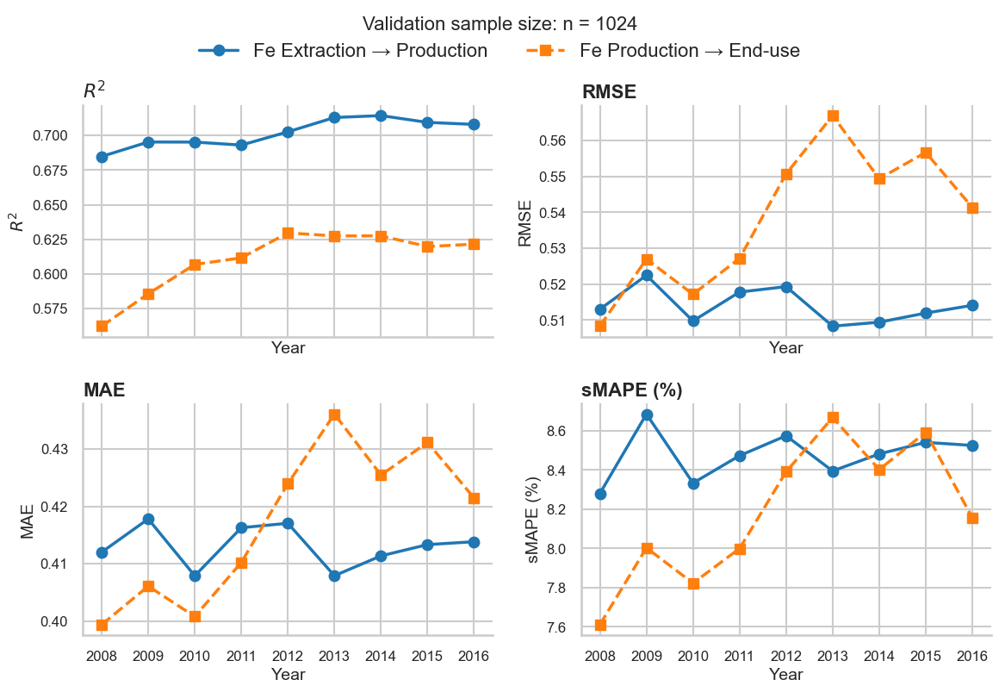

In [34]:
# Load data
s1 = pd.read_csv(output_path + "bilateral_validation_s1.csv")
s2 = pd.read_csv(output_path + "bilateral_validation_s2.csv")

# Extract sample size (identical)
n_points = int(s1["n_points"].iloc[0])

# Labels
labels = [
    "Fe Extraction → Production",
    "Fe Production → End-use"
]

# Aesthetics
sns.set(style="whitegrid", context="talk", font_scale=1.1)
plt.rcParams["axes.labelsize"] = 14
plt.rcParams["axes.titlesize"] = 16

# Figure setup
fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharex=True)
axes = axes.flatten()

colors = ["#1f77b4", "#ff7f0e"]  # Blue, Orange
metrics = [
    ("R2", r"$R^2$"),
    ("RMSE", "RMSE"),
    ("MAE", "MAE"),
    ("sMAPE", "sMAPE (%)")
]

# Plotting
for ax, (metric, ylabel) in zip(axes, metrics):
    ax.plot(s1["Year"], s1[metric], 'o-', lw=2.5, color=colors[0], label=labels[0])
    ax.plot(s2["Year"], s2[metric], 's--', lw=2.5, color=colors[1], label=labels[1])
    
    ax.set_title(ylabel, loc='left', fontweight='bold')
    ax.set_ylabel(ylabel)
    ax.set_xlabel("Year")
    
    # Clean frame
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)

# Shared legend above all panels
handles, labs = axes[0].get_legend_handles_labels()
legend_title = f"Validation sample size: n = {n_points}"
fig.legend(
    handles, labs, 
    title=legend_title, 
    loc="upper center", 
    bbox_to_anchor=(0.5, 1.03),  # above figure
    ncol=2, frameon=False, fontsize=16, title_fontsize=16
)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig(plot_path + "bilateral_time_series_validation.pdf", dpi=600)
plt.show()


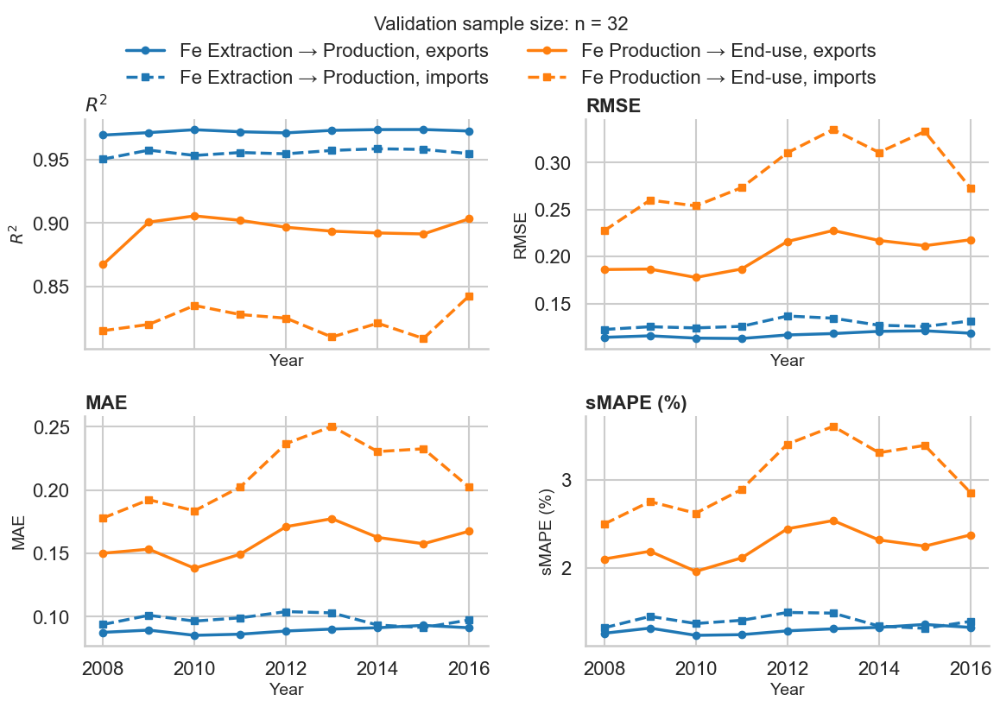

In [35]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load data
s1 = pd.read_csv(output_path + "regional_validation_s1.csv")
s2 = pd.read_csv(output_path + "regional_validation_s2.csv")

# Sample size (same for all)
n_points = int(s1["n_points"].iloc[0])

# Metrics to plot
metrics = [("R2", r"$R^2$"), 
           ("RMSE", "RMSE"), 
           ("MAE", "MAE"), 
           ("sMAPE", "sMAPE (%)")]

# Aesthetics
sns.set(style="whitegrid", context="talk", font_scale=1.1)
plt.rcParams["axes.labelsize"] = 14
plt.rcParams["axes.titlesize"] = 16

# Figure setup: 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharex=True)
axes = axes.flatten()

# Colors: S1 = blue, S2 = orange
colors = {"s1": "#1f77b4", "s2": "#ff7f0e"}

# Plot each metric
for ax, (metric, ylabel) in zip(axes, metrics):
    for model_name, df, color in [("Fe Extraction → Production", s1, colors["s1"]),
                                  ("Fe Production → End-use", s2, colors["s2"])]:
        for trade, marker, linestyle in [("exports", "o", "-"), ("imports", "s", "--")]:
            data = df[df["Trade"]==trade]
            ax.plot(data["year"], data[metric], linestyle=linestyle, lw=2.5,
                    color=color, marker=marker, markersize=6,
                    label=f"{model_name}, {trade}")

    ax.set_title(ylabel, loc='left', fontweight='bold')
    ax.set_ylabel(ylabel)
    ax.set_xlabel("Year")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.tick_params(axis='x', labelsize=16)
    ax.tick_params(axis='y', labelsize=16)

# Shared legend above panels
handles, labels = axes[0].get_legend_handles_labels()
legend_title = f"Validation sample size: n = {n_points}"
fig.legend(handles, labels, title=legend_title, loc="upper center",
           bbox_to_anchor=(0.5, 1.05), ncol=2, frameon=False,
           fontsize=16, title_fontsize=16)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig(plot_path + "regional_time_series_validation.pdf", dpi=600)
plt.show()


In [170]:
# Load CSV (replace with your full file path)
df = pd.read_csv( output_path + 'model_output_s1.csv')

# Exclude domestic flows (e.g., China→China, AUS→AUS)
df = df[df['exp_ISO3'] != df['imp_ISO3']]

# Label importers: China (CHN) or ROW
df['imp_group'] = np.where(df['imp_ISO3'] == 'CHN', 'China', 'ROW')

# Sum tonnes by exporter, group, and year
flows = df.groupby(['exp_ISO3', 'imp_group', 'year'])['pred_tonnes'].sum().reset_index()

# Compute correlation (raw volumes)
total_flows = flows.groupby(['imp_group', 'year'])['pred_tonnes'].sum().reset_index()
china_totals = total_flows[total_flows['imp_group'] == 'China'].set_index('year')['pred_tonnes']
row_totals = total_flows[total_flows['imp_group'] == 'ROW'].set_index('year')['pred_tonnes']
correlation = china_totals.corr(row_totals) if len(china_totals) > 1 else np.nan
print(f"Correlation between China and ROW import growth: {correlation:.2f}")

# Pivot: rows = (exporter, group), columns = years
pivot = flows.pivot(index=['exp_ISO3', 'imp_group'], columns='year', values='pred_tonnes').fillna(0)

# Calculate change: 2016 - 2008
years = sorted(pivot.columns)
pivot['change'] = pivot[years[-1]] - pivot[years[0]]

# Exporters increasing to China
china = pivot.xs('China', level='imp_group')
exporters_to_china = china[china['change'] > 0].index.tolist()

# Deprived amount: sum negative ROW changes from those exporters
row = pivot.xs('ROW', level='imp_group').loc[exporters_to_china]
deprived = -row['change'][row['change'] < 0].sum()

# Total increase to China
total_china_increase = china['change'][china['change'] > 0].sum()

# Deprivation percentage
deprivation_pct = (deprived / total_china_increase * 100) if total_china_increase > 0 else 0

# Print results
print(f"Total increase to China: {total_china_increase:.2f} tonnes")
print(f"Deprived from ROW: {deprived:.2f} tonnes")
print(f"Deprivation %: {deprivation_pct:.1f}%")

Correlation between China and ROW import growth: 0.53
Total increase to China: 261968384.70 tonnes
Deprived from ROW: 69670789.21 tonnes
Deprivation %: 26.6%


In [172]:
# Load CSV (replace with your full file path)
df = pd.read_csv( output_path + 'model_output_s2.csv')

# Exclude domestic flows (e.g., China→China, AUS→AUS)
df = df[df['exp_ISO3'] != df['imp_ISO3']]

# Label importers: China (CHN) or ROW
df['imp_group'] = np.where(df['imp_ISO3'] == 'CHN', 'China', 'ROW')

# Sum tonnes by exporter, group, and year
flows = df.groupby(['exp_ISO3', 'imp_group', 'year'])['pred_tonnes'].sum().reset_index()

# Compute correlation (raw volumes)
total_flows = flows.groupby(['imp_group', 'year'])['pred_tonnes'].sum().reset_index()
china_totals = total_flows[total_flows['imp_group'] == 'China'].set_index('year')['pred_tonnes']
row_totals = total_flows[total_flows['imp_group'] == 'ROW'].set_index('year')['pred_tonnes']
correlation = china_totals.corr(row_totals) if len(china_totals) > 1 else np.nan
print(f"Correlation between China and ROW import growth: {correlation:.2f}")

# Pivot: rows = (exporter, group), columns = years
pivot = flows.pivot(index=['exp_ISO3', 'imp_group'], columns='year', values='pred_tonnes').fillna(0)

# Calculate change: 2016 - 2008
years = sorted(pivot.columns)
pivot['change'] = pivot[years[-1]] - pivot[years[0]]

# Exporters increasing to China
china = pivot.xs('China', level='imp_group')
exporters_to_china = china[china['change'] > 0].index.tolist()

# Deprived amount: sum negative ROW changes from those exporters
row = pivot.xs('ROW', level='imp_group').loc[exporters_to_china]
deprived = -row['change'][row['change'] < 0].sum()

# Total increase to China
total_china_increase = china['change'][china['change'] > 0].sum()

# Deprivation percentage
deprivation_pct = (deprived / total_china_increase * 100) if total_china_increase > 0 else 0

# Print results
print(f"Total increase to China: {total_china_increase:.2f} tonnes")
print(f"Deprived from ROW: {deprived:.2f} tonnes")
print(f"Deprivation %: {deprivation_pct:.1f}%")

Correlation between China and ROW import growth: 0.42
Total increase to China: 81404976.21 tonnes
Deprived from ROW: 44952314.02 tonnes
Deprivation %: 55.2%


In [181]:
# Load CSV (replace with your full file path)
df_s1 = pd.read_csv( output_path + 'model_output_s1.csv')
df_s2 = pd.read_csv( output_path + 'model_output_s2.csv')
df_merged = pd.concat([df_s1, df_s2], ignore_index=True)

# Group by exporter, importer, and year, summing pred_tonnes
df = (
    df_merged.groupby(['exp_ISO3', 'imp_ISO3', 'year'], as_index=False)['pred_tonnes']
    .sum()
)

# Exclude domestic flows (e.g., China→China, AUS→AUS)
df = df[df['exp_ISO3'] != df['imp_ISO3']]

# Label importers: China (CHN) or ROW
df['imp_group'] = np.where(df['imp_ISO3'] == 'CHN', 'China', 'ROW')

# Sum tonnes by exporter, group, and year
flows = df.groupby(['exp_ISO3', 'imp_group', 'year'])['pred_tonnes'].sum().reset_index()

# Compute correlation (raw volumes)
total_flows = flows.groupby(['imp_group', 'year'])['pred_tonnes'].sum().reset_index()
china_totals = total_flows[total_flows['imp_group'] == 'China'].set_index('year')['pred_tonnes']
row_totals = total_flows[total_flows['imp_group'] == 'ROW'].set_index('year')['pred_tonnes']
correlation = china_totals.corr(row_totals) if len(china_totals) > 1 else np.nan
print(f"Correlation between China and ROW import growth: {correlation:.2f}")

# Pivot: rows = (exporter, group), columns = years
pivot = flows.pivot(index=['exp_ISO3', 'imp_group'], columns='year', values='pred_tonnes').fillna(0)

# Calculate change: 2016 - 2008
years = sorted(pivot.columns)
pivot['change'] = pivot[years[-1]] - pivot[years[0]]

# Exporters increasing to China
china = pivot.xs('China', level='imp_group')
exporters_to_china = china[china['change'] > 0].index.tolist()

# Deprived amount: sum negative ROW changes from those exporters
row = pivot.xs('ROW', level='imp_group').loc[exporters_to_china]
deprived = -row['change'][row['change'] < 0].sum() * 1e-6

# Total increase to China
total_china_increase = china['change'][china['change'] > 0].sum() * 1e-6

# Deprivation percentage
deprivation_pct = (deprived / total_china_increase * 100) if total_china_increase > 0 else 0

# Print results
print(f"Total increase to China: {total_china_increase:.2f} Mt")
print(f"Deprived from ROW: {deprived:.2f} Mt")
print(f"Deprivation %: {deprivation_pct:.1f}%")

Correlation between China and ROW import growth: 0.56
Total increase to China: 340.92 Mt
Deprived from ROW: 113.16 Mt
Deprivation %: 33.2%


In [204]:
# Load CSV (replace with your full file path)
df_s1 = pd.read_csv( output_path + 'model_output_s1.csv')
df_s2 = pd.read_csv( output_path + 'model_output_s2.csv')
df_merged = pd.concat([df_s1, df_s2], ignore_index=True)

# Group by exporter, importer, and year, summing pred_tonnes
df = (
    df_merged.groupby(['exp_ISO3', 'imp_ISO3', 'year'], as_index=False)['pred_tonnes']
    .sum()
)
# Exclude domestic flows (e.g., China→China, AUS→AUS)
df = df[df['exp_ISO3'] != df['imp_ISO3']]

# Label importers: China (CHN) or ROW
df['imp_group'] = np.where(df['imp_ISO3'] == 'CHN', 'China', 'ROW')

# Step 1: Aggregate total imports per importer and globally
imports = flows.groupby(['imp_group', 'year'])['pred_tonnes'].sum().reset_index()
world_imports = imports.groupby('year')['pred_tonnes'].sum().rename('world_total')

# Merge global totals back
imports = imports.merge(world_imports, on='year')

# Step 2: Pick two years (t1 and t2)
t1, t2 = imports['year'].min(), imports['year'].max()

t1 = 2008
t2 = 2009

# Step 3: Extract values
ix_t1 = imports.loc[(imports['imp_group'] == 'China') & (imports['year'] == t1), 'pred_tonnes'].values[0]
ix_t2 = imports.loc[(imports['imp_group'] == 'China') & (imports['year'] == t2), 'pred_tonnes'].values[0]

sum_ir_t1 = imports.loc[imports['year'] == t1, 'world_total'].iloc[0]
sum_ir_t2 = imports.loc[imports['year'] == t2, 'world_total'].iloc[0]

# Step 4: Compute diversion/addition
# Expected total if all of China’s increase were additive
expected_total_t2 = sum_ir_t1 + (ix_t2 - ix_t1)

if sum_ir_t2 >= expected_total_t2:
    # Pure addition case
    diversion = 0
    addition = ix_t2 - ix_t1
else:
    # Some diversion from others
    diversion = (sum_ir_t2 - sum_ir_t1) - (ix_t2 - ix_t1)
    addition = (ix_t2 - ix_t1) + diversion  # since total change = addition + diversion

# Step 5: Express diversion fraction
diversion_fraction = (diversion / sum_ir_t1) * 100

print(f"China's import increase: {(ix_t2 - ix_t1)*1e-6:.2f} Mt")
print(f"World total increase: {(sum_ir_t2 - sum_ir_t1)*1e-6:.2f} Mt")
print(f"Diversion: {diversion*1e-6:.2f} Mt ({diversion_fraction:.2f}% of prior world imports)")


China's import increase: 74.72 Mt
World total increase: -220.27 Mt
Diversion: -295.00 Mt (-14.27% of prior world imports)


In [215]:
# Load CSV (replace with your full file path)
df_s1 = pd.read_csv( output_path + 'model_output_s1.csv')
df_s2 = pd.read_csv( output_path + 'model_output_s2.csv')

df_merged = pd.concat([df_s1, df_s2], ignore_index=True)

# Group by exporter, importer, and year, summing pred_tonnes
df = (
    df_merged.groupby(['exp_ISO3', 'imp_ISO3', 'year'], as_index=False)['pred_tonnes']
    .sum()
)

# Exclude domestic flows (e.g., China→China, AUS→AUS)
df = df[df['exp_ISO3'] != df['imp_ISO3']]

# Label importers: China (CHN) or ROW
df['imp_group'] = np.where(df['imp_ISO3'] == 'CHN', 'China', 'ROW')

# Sum tonnes by exporter, group, and year
flows = df.groupby(['exp_ISO3', 'imp_group', 'year'])['pred_tonnes'].sum().reset_index()

# Aggregate total imports per importer
imports = flows.groupby(['imp_group', 'year'])['pred_tonnes'].sum().reset_index()

# Total world imports per year
world = imports.groupby('year')['pred_tonnes'].sum().rename('world_total')
imports = imports.merge(world, on='year')

# Sort years
imports = imports.sort_values('year')

# Extract China imports and world totals
china = imports[imports['imp_group'] == 'China'][['year', 'pred_tonnes']].rename(columns={'pred_tonnes': 'china'})
world = imports[['year', 'world_total']].drop_duplicates()
df = china.merge(world, on='year')

# Year-to-year changes
df['delta_china'] = df['china'].diff()
df['delta_world'] = df['world_total'].diff()

# Diversion: D = ΔIx - ΔΣIr
df['diversion'] = df['delta_china'] - df['delta_world']

# Addition: A = ΔIx - D
df['addition'] = df['delta_china'] - df['diversion']

# Diversion fraction relative to previous year world total
df['diversion_fraction_%'] = df['diversion'] / df['world_total'].shift(1) * 100

# Replace NaN in the first year with 0
df = df.fillna(0)

# Cumulative totals
cumulative_addition = df['addition'][df['addition'] > 0].sum()
cumulative_diversion = df['diversion'][df['diversion'] > 0].sum()

print(df[['year', 'delta_china', 'delta_world', 'diversion', 'addition', 'diversion_fraction_%']])
print(f"Cumulative addition (2008-2016): {cumulative_addition*1e-6:.2f} Mt")
print(f"Cumulative diversion (2008-2016): {cumulative_diversion*1e-6:.2f} Mt")


   year   delta_china   delta_world     diversion      addition  \
0  2008  0.000000e+00  0.000000e+00  0.000000e+00  0.000000e+00   
1  2009  1.811375e+08 -1.601834e+08  3.413209e+08 -1.601834e+08   
2  2010  1.110449e+08  3.438032e+08 -2.327583e+08  3.438032e+08   
3  2011  1.082620e+08  1.801090e+08 -7.184699e+07  1.801090e+08   
4  2012  3.677842e+07  2.994045e+07  6.837975e+06  2.994045e+07   
5  2013  1.400459e+08  1.393539e+08  6.920160e+05  1.393539e+08   
6  2014  2.951716e+06  7.170017e+07 -6.874845e+07  7.170017e+07   
7  2015 -5.071926e+07 -1.013541e+08  5.063488e+07 -1.013541e+08   
8  2016 -2.105262e+05  4.224675e+07 -4.245728e+07  4.224675e+07   

   diversion_fraction_%  
0              0.000000  
1             13.561689  
2             -9.876789  
3             -2.660584  
4              0.237386  
5              0.023777  
6             -2.254177  
7              1.622120  
8             -1.405790  
Cumulative addition (2008-2016): 807.15 Mt
Cumulative diversion (2008

In [211]:
df.sum()

year                    1.810800e+04
china                   8.357151e+09
world_total             2.033431e+10
delta_china             3.402245e+08
delta_world             3.776091e+08
diversion              -3.738460e+07
addition                3.776091e+08
diversion_fraction_%   -2.628409e+00
dtype: float64

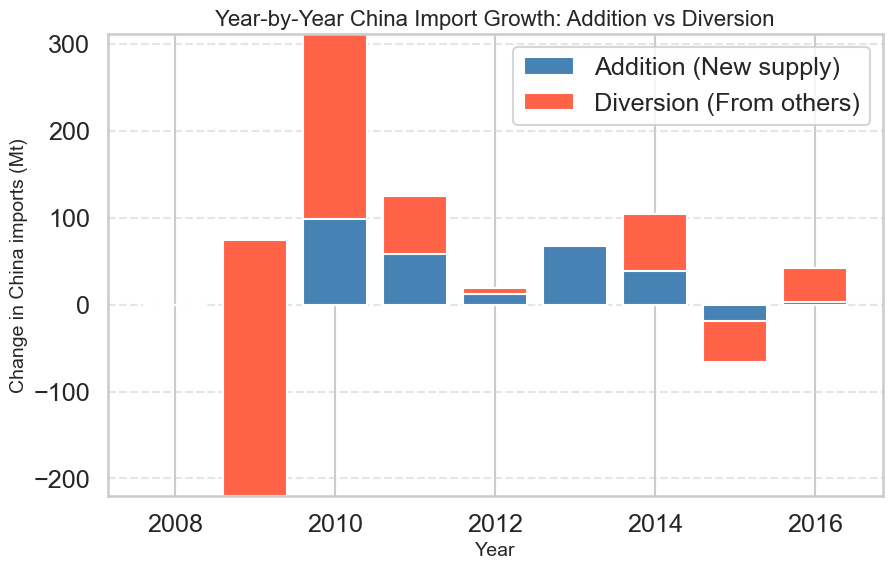

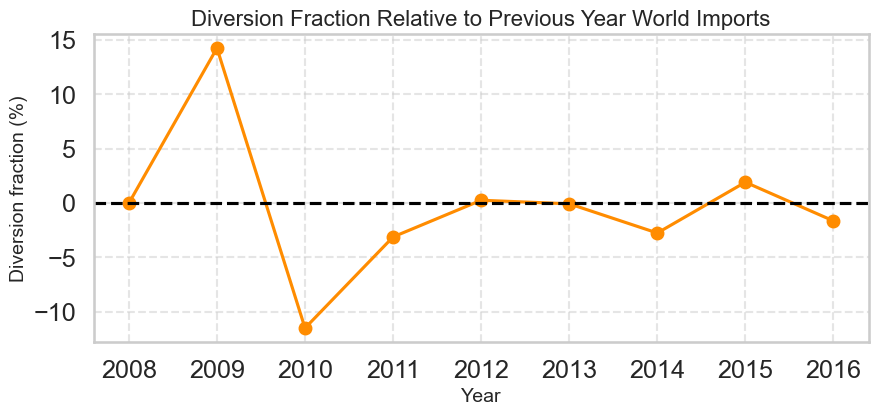

Cumulative addition (2008-2016): 664.31 Mt
Cumulative diversion (2008-2016): 348.46 Mt


In [209]:
import matplotlib.pyplot as plt

# df already has: year, delta_china, delta_world, diversion, addition, diversion_fraction_%
# Fill NaNs (first year)
df = df.fillna(0)

# Plot diversion and addition over time
plt.figure(figsize=(10,6))

# Bar plot: addition vs diversion
plt.bar(df['year'], df['addition']*1e-6, label='Addition (New supply)', color='steelblue')
plt.bar(df['year'], df['diversion']*1e-6, bottom=df['addition']*1e-6, label='Diversion (From others)', color='tomato')

plt.xlabel('Year')
plt.ylabel('Change in China imports (Mt)')
plt.title("Year-by-Year China Import Growth: Addition vs Diversion")
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.show()

# Plot diversion fraction (% of previous year world imports)
plt.figure(figsize=(10,4))
plt.plot(df['year'], df['diversion_fraction_%'], marker='o', color='darkorange')
plt.axhline(0, color='black', linestyle='--')
plt.xlabel('Year')
plt.ylabel('Diversion fraction (%)')
plt.title('Diversion Fraction Relative to Previous Year World Imports')
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

# Print cumulative totals
cumulative_addition = df['addition'][df['addition'] > 0].sum()
cumulative_diversion = df['diversion'][df['diversion'] > 0].sum()
print(f"Cumulative addition (2008-2016): {cumulative_addition*1e-6:.2f} Mt")
print(f"Cumulative diversion (2008-2016): {cumulative_diversion*1e-6:.2f} Mt")


In [194]:
# imports already has ['imp_group', 'year', 'pred_tonnes'] from your code
imports = flows.groupby(['imp_group', 'year'])['pred_tonnes'].sum().reset_index()

# Compute total world imports per year
world = imports.groupby('year')['pred_tonnes'].sum().rename('world_total')
imports = imports.merge(world, on='year')

# Sort years
imports = imports.sort_values('year')

# Extract China's imports and world totals
china = imports[imports['imp_group'] == 'China'][['year', 'pred_tonnes']].rename(columns={'pred_tonnes': 'china'})
world = imports[['year', 'world_total']].drop_duplicates()

df = china.merge(world, on='year')

# Compute year-to-year changes (Δ)
df['delta_china'] = df['china'].diff()
df['delta_world'] = df['world_total'].diff()

# Compute diversion per year using professor’s logic
# diversion = ΔWorld - ΔChina
# (if ΔWorld < ΔChina, diversion is negative => flows diverted from others)
df['diversion'] = df['delta_world'] - df['delta_china']

# Diversion fraction relative to previous year's total world imports
df['diversion_fraction_%'] = df['diversion'] / df['world_total'].shift(1) * 100

print(df[['year', 'delta_china', 'delta_world', 'diversion', 'diversion_fraction_%']])


   year   delta_china   delta_world     diversion  diversion_fraction_%
0  2008           NaN           NaN           NaN                   NaN
1  2009  7.472439e+07 -2.202721e+08 -2.949965e+08            -14.269254
2  2010  9.871059e+07  3.112417e+08  2.125311e+08             11.506292
3  2011  5.787084e+07  1.251040e+08  6.723319e+07              3.115060
4  2012  1.861535e+07  1.263189e+07 -5.983465e+06             -0.262038
5  2013  6.734725e+07  6.885460e+07  1.507349e+06              0.065649
6  2014  3.923013e+07  1.043755e+08  6.514539e+07              2.754658
7  2015 -1.894227e+07 -6.642574e+07 -4.748346e+07             -1.922958
8  2016  2.668183e+06  4.209923e+07  3.943104e+07              1.640999


In [196]:
cumulative_diversion = df['diversion'].sum()
cumulative_addition = df['delta_china'].sum() - abs(cumulative_diversion)
cumulative_addition

np.float64(302839859.7579777)

In [190]:
expected_total_t2 * 1e-6, sum_ir_t2*1e-6

(np.float64(2407.582201639063), np.float64(2444.9667986722548))

In [179]:
import pandas as pd

# Load CSV (replace with your full file path)
df_s1 = pd.read_csv( output_path + 'model_output_s1.csv')
df_s2 = pd.read_csv( output_path + 'model_output_s2.csv')
df_merged = pd.concat([df_s1, df_s2], ignore_index=True)

# Group by exporter, importer, and year, summing pred_tonnes
df = (
    df_merged.groupby(['exp_ISO3', 'imp_ISO3', 'year'], as_index=False)['pred_tonnes']
    .sum()
)

# Exclude domestic flows
df = df[df['exp_ISO3'] != df['imp_ISO3']]

# Set t1 and t2
t1 = 2008
t2 = 2016

# Total imports per year
total_imports = df.groupby('year')['pred_tonnes'].sum()

# Change in total imports
total_t1 = total_imports.get(t1, 0)
total_t2 = total_imports.get(t2, 0)
change_total = total_t2 - total_t1

# China imports per year (country x)
china_df = df[df['imp_ISO3'] == 'CHN']
china_imports = china_df.groupby('year')['pred_tonnes'].sum()

china_t1 = china_imports.get(t1, 0)
china_t2 = china_imports.get(t2, 0)
change_china = china_t2 - china_t1

# Diversion D (if change_total < change_china)
D = max(0, change_china - change_total)

# Diverted fraction
diverted_fraction = (D / total_t1 * 100) if total_t1 > 0 else 0

# Print results
print(f"Total imports {t1}: {total_t1:.2f} tonnes")
print(f"Total imports {t2}: {total_t2:.2f} tonnes")
print(f"Change in total imports: {change_total:.2f} tonnes")
print(f"China imports {t1}: {china_t1:.2f} tonnes")
print(f"China imports {t2}: {china_t2:.2f} tonnes")
print(f"Change in China imports: {change_china:.2f} tonnes")

if D == 0:
    print("No diversion: China's increase was an addition (independent).")
else:
    print(f"Diversion D: {D:.2f} tonnes")
    print(f"Diverted fraction: {diverted_fraction:.1f}%")
    print("Diversion occurred: Some flows were redirected from ROW to China (interdependent).")

Total imports 2008: 2067357744.85 tonnes
Total imports 2016: 2444966798.67 tonnes
Change in total imports: 377609053.82 tonnes
China imports 2008: 697357473.46 tonnes
China imports 2016: 1037581930.25 tonnes
Change in China imports: 340224456.79 tonnes
No diversion: China's increase was an addition (independent).


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ---------------------------
# 1. Load CSVs and merge
# ---------------------------
df_s1 = pd.read_csv(output_path + 'model_output_s1.csv')
df_s2 = pd.read_csv(output_path + 'model_output_s2.csv')
df_merged = pd.concat([df_s1, df_s2], ignore_index=True)

# ---------------------------
# 2. Group by exporter, importer, year
# ---------------------------
df = (
    df_merged.groupby(['exp_ISO3', 'imp_ISO3', 'year'], as_index=False)['pred_tonnes']
    .sum()
)

# ---------------------------
# 3. Exclude domestic flows
# ---------------------------
df = df[df['exp_ISO3'] != df['imp_ISO3']]

# ---------------------------
# 4. Label importers: China or ROW
# ---------------------------
df['imp_group'] = np.where(df['imp_ISO3'] == 'CHN', 'China', 'ROW')

# ---------------------------
# 5. Sum tonnes by exporter, group, year
# ---------------------------
flows = df.groupby(['exp_ISO3', 'imp_group', 'year'])['pred_tonnes'].sum().reset_index()

# ---------------------------
# 6. Aggregate total imports per importer
# ---------------------------
imports = flows.groupby(['imp_group', 'year'])['pred_tonnes'].sum().reset_index()

# Total world imports per year
world = imports.groupby('year')['pred_tonnes'].sum().rename('world_total')
imports = imports.merge(world, on='year')

# Sort years
imports = imports.sort_values('year')

# ---------------------------
# 7. Extract China imports and world totals
# ---------------------------
china = imports[imports['imp_group'] == 'China'][['year', 'pred_tonnes']].rename(columns={'pred_tonnes': 'china'})
world = imports[['year', 'world_total']].drop_duplicates()
df = china.merge(world, on='year')

# ---------------------------
# 8. Year-to-year changes
# ---------------------------
df['delta_china'] = df['china'].diff()
df['delta_world'] = df['world_total'].diff()

# ---------------------------
# 9. Compute diversion and addition
# ---------------------------
df['diversion'] = df['delta_china'] - df['delta_world']  # D = ΔIx - ΔΣIr
df['addition'] = df['delta_china'] - df['diversion']    # A = ΔIx - D

# Diversion fraction relative to previous year world total
df['diversion_fraction_%'] = df['diversion'] / df['world_total'].shift(1) * 100

# Replace NaN in first year with 0
df = df.fillna(0)

# ---------------------------
# 10. Cumulative totals
# ---------------------------
cumulative_addition = df['addition'][df['addition'] > 0].sum()
cumulative_diversion = df['diversion'][df['diversion'] > 0].sum()

print(df[['year', 'delta_china', 'delta_world', 'diversion', 'addition', 'diversion_fraction_%']])
print(f"Cumulative addition (2008-2016): {cumulative_addition*1e-6:.2f} Mt")
print(f"Cumulative diversion (2008-2016): {cumulative_diversion*1e-6:.2f} Mt")



   year   delta_china   delta_world     diversion      addition  \
0  2008  0.000000e+00  0.000000e+00  0.000000e+00  0.000000e+00   
1  2009  7.472439e+07 -2.202721e+08  2.949965e+08 -2.202721e+08   
2  2010  9.871059e+07  3.112417e+08 -2.125311e+08  3.112417e+08   
3  2011  5.787084e+07  1.251040e+08 -6.723319e+07  1.251040e+08   
4  2012  1.861535e+07  1.263189e+07  5.983465e+06  1.263189e+07   
5  2013  6.734725e+07  6.885460e+07 -1.507349e+06  6.885460e+07   
6  2014  3.923013e+07  1.043755e+08 -6.514539e+07  1.043755e+08   
7  2015 -1.894227e+07 -6.642574e+07  4.748346e+07 -6.642574e+07   
8  2016  2.668183e+06  4.209923e+07 -3.943104e+07  4.209923e+07   

   diversion_fraction_%  
0              0.000000  
1             14.269254  
2            -11.506292  
3             -3.115060  
4              0.262038  
5             -0.065649  
6             -2.754658  
7              1.922958  
8             -1.640999  
Cumulative addition (2008-2016): 664.31 Mt
Cumulative diversion (2008

In [5]:
df.to_csv(output_path + "diversion_2008_2016.csv", index=False)

In [6]:
df

,year,china,world_total,delta_china,delta_world,diversion,addition,diversion_fraction_%
0,2008,6.973575e+08,2.067358e+09,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000
1,2009,7.720819e+08,1.847086e+09,7.472439e+07,-2.202721e+08,2.949965e+08,-2.202721e+08,14.269254
2,2010,8.707924e+08,2.158327e+09,9.871059e+07,3.112417e+08,-2.125311e+08,3.112417e+08,-11.506292
3,2011,9.286633e+08,2.283431e+09,5.787084e+07,1.251040e+08,-6.723319e+07,1.251040e+08,-3.115060
4,2012,9.472786e+08,2.296063e+09,1.861535e+07,1.263189e+07,5.983465e+06,1.263189e+07,0.262038
5,2013,1.014626e+09,2.364918e+09,6.734725e+07,6.885460e+07,-1.507349e+06,6.885460e+07,-0.065649
6,2014,1.053856e+09,2.469293e+09,3.923013e+07,1.043755e+08,-6.514539e+07,1.043755e+08,-2.754658
7,2015,1.034914e+09,2.402868e+09,-1.894227e+07,-6.642574e+07,4.748346e+07,-6.642574e+07,1.922958
8,2016,1.037582e+09,2.444967e+09,2.668183e+06,4.209923e+07,-3.943104e+07,4.209923e+07,-1.640999


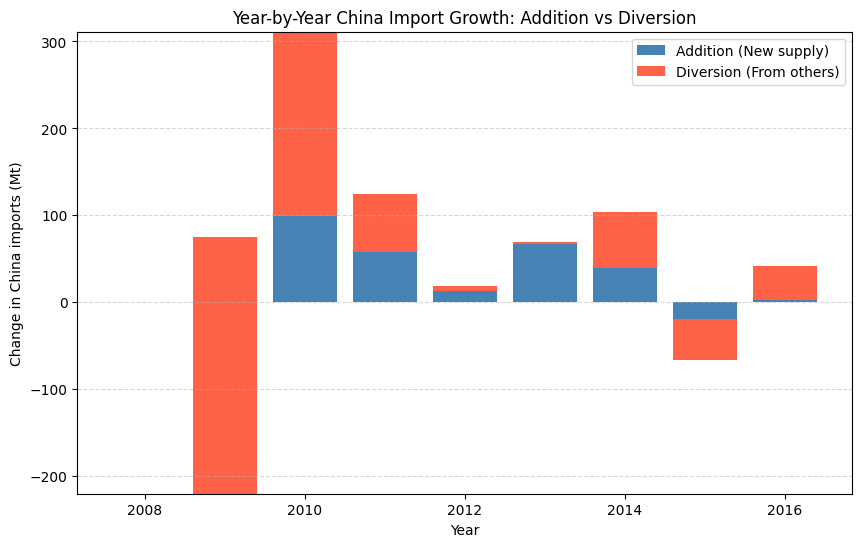

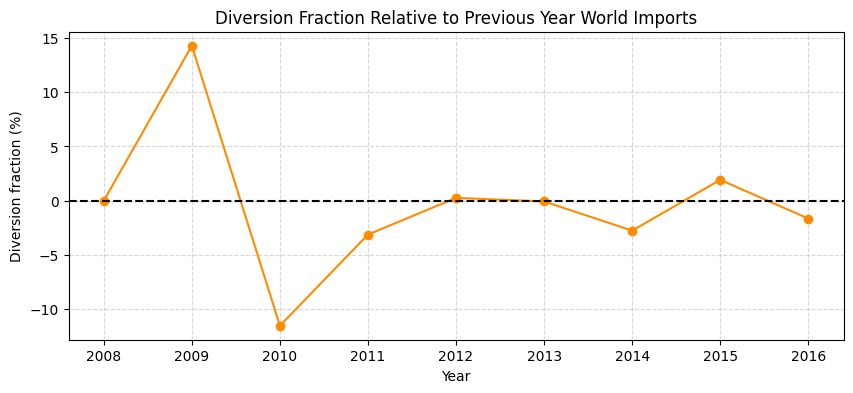

In [4]:
# ---------------------------
# 11. Visualization
# ---------------------------

# Stacked bar plot: addition vs diversion
plt.figure(figsize=(10,6))
plt.bar(df['year'], df['addition']*1e-6, label='Addition (New supply)', color='steelblue')
plt.bar(df['year'], df['diversion']*1e-6, bottom=df['addition']*1e-6, label='Diversion (From others)', color='tomato')
plt.xlabel('Year')
plt.ylabel('Change in China imports (Mt)')
plt.title('Year-by-Year China Import Growth: Addition vs Diversion')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()

# Line plot: diversion fraction as % of previous year world imports
plt.figure(figsize=(10,4))
plt.plot(df['year'], df['diversion_fraction_%'], marker='o', color='darkorange')
plt.axhline(0, color='black', linestyle='--')
plt.xlabel('Year')
plt.ylabel('Diversion fraction (%)')
plt.title('Diversion Fraction Relative to Previous Year World Imports')
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()